#### Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.path as mpath
import matplotlib.cm as cm
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as ticker
import cartopy.mpl.gridliner as gridliner
import matplotlib.ticker as mticker
import warnings
warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", message="All-NaN slice encountered")

### Esemble 1001-001

`Labrador Coast Domain`

In [3]:
path='/Users/thomas/Documents/Data'
ds=xr.open_mfdataset(path+'/esemble 1001-001/*.nc')

In [4]:
aice=ds['aice']
tarea=ds['tarea']

In [5]:
# Define the Labrador coast boundaries (replace these with your desired region)
lat_min, lat_max = 50, 61
lon_min, lon_max =295, 310 #65W & 55W

# Create a mask for Labrador coast 
mask = ((aice.TLAT >= lat_min) & (aice.TLAT <= lat_max) &
        (aice.TLON >= lon_min) & (aice.TLON <= lon_max))

mask2 = ((tarea.TLAT >= lat_min) & (tarea.TLAT <= lat_max) &
        (tarea.TLON >= lon_min) & (tarea.TLON <= lon_max))

# Apply the mask to the aice variable
aice__region =aice.where(mask, drop=True)
tarea_region=tarea.where(mask2, drop=True)

In [6]:
aice_region=((aice__region.where(aice__region>=0.15))*tarea_region)/1e12
aice_region=aice_region.where(aice_region>0,0)

In [44]:
#Hist
aice_1850_59=aice_region.sel(time=slice('1850-02-01','1860-01-01'))
aice_1860_69=aice_region.sel(time=slice('1860-02-01','1870-01-01'))
aice_1870_79=aice_region.sel(time=slice('1870-02-01','1880-01-01'))
aice_1880_89=aice_region.sel(time=slice('1880-02-01','1890-01-01'))
aice_1890_99=aice_region.sel(time=slice('1890-02-01','1900-01-01'))
aice_1900_09=aice_region.sel(time=slice('1900-02-01','1910-01-01'))
aice_1910_19=aice_region.sel(time=slice('1910-02-01','1920-01-01'))
aice_1920_29=aice_region.sel(time=slice('1920-02-01','1930-01-01'))
aice_1930_39=aice_region.sel(time=slice('1930-02-01','1940-01-01'))
aice_1940_49=aice_region.sel(time=slice('1940-02-01','1950-01-01'))
aice_1950_59=aice_region.sel(time=slice('1950-02-01','1960-01-01'))
aice_1960_69=aice_region.sel(time=slice('1960-02-01','1970-01-01'))
aice_1970_79=aice_region.sel(time=slice('1970-02-01','1980-01-01'))
aice_1980_89=aice_region.sel(time=slice('1980-02-01','1990-01-01'))
aice_1990_99=aice_region.sel(time=slice('1990-02-01','2000-01-01'))
aice_2000_09=aice_region.sel(time=slice('2000-02-01','2010-01-01'))
aice_2010_14=aice_region.sel(time=slice('2010-02-01','2020-01-01'))
#Future
#aice_2015_24=aice_region.sel(time=slice('201-02-01','2020-01-01'))
aice_2025_34=aice_region.sel(time=slice('2020-02-01','2030-01-01'))
aice_2035_44=aice_region.sel(time=slice('2030-02-01','2040-01-01'))
aice_2045_54=aice_region.sel(time=slice('2040-02-01','2050-01-01'))
aice_2055_64=aice_region.sel(time=slice('2050-02-01','2060-01-01'))
aice_2065_74=aice_region.sel(time=slice('2060-02-01','2070-01-01'))
aice_2075_84=aice_region.sel(time=slice('2070-02-01','2080-01-01'))
aice_2085_94=aice_region.sel(time=slice('2080-02-01','2090-01-01'))
aice_2095_100=aice_region.sel(time=slice('2090-02-01','2101-01-01'))

In [45]:
#monthly mean hist
aice_1850_59_monthly=aice_1850_59.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1860_69_monthly=aice_1860_69.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1870_79_monthly=aice_1870_79.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1880_89_monthly=aice_1880_89.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1890_99_monthly=aice_1890_99.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1900_09_monthly=aice_1900_09.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1910_19_monthly=aice_1910_19.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1920_29_monthly=aice_1920_29.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1930_39_monthly=aice_1930_39.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1940_49_monthly=aice_1940_49.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1950_59_monthly=aice_1950_59.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1960_69_monthly=aice_1960_69.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1970_79_monthly=aice_1970_79.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1980_89_monthly=aice_1980_89.groupby('time.month').mean('time').sum(('nj','ni'))
aice_1990_99_monthly=aice_1990_99.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2000_09_monthly=aice_2000_09.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2010_14_monthly=aice_2010_14.groupby('time.month').mean('time').sum(('nj','ni'))

#monthly mean future
aice_2015_24_monthly=aice_2015_24.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2025_34_monthly=aice_2025_34.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2035_44_monthly=aice_2035_44.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2045_54_monthly=aice_2045_54.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2055_64_monthly=aice_2055_64.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2065_74_monthly=aice_2065_74.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2075_84_monthly=aice_2075_84.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2085_94_monthly=aice_2085_94.groupby('time.month').mean('time').sum(('nj','ni'))
aice_2095_100_monthly=aice_2095_100.groupby('time.month').mean('time').sum(('nj','ni'))

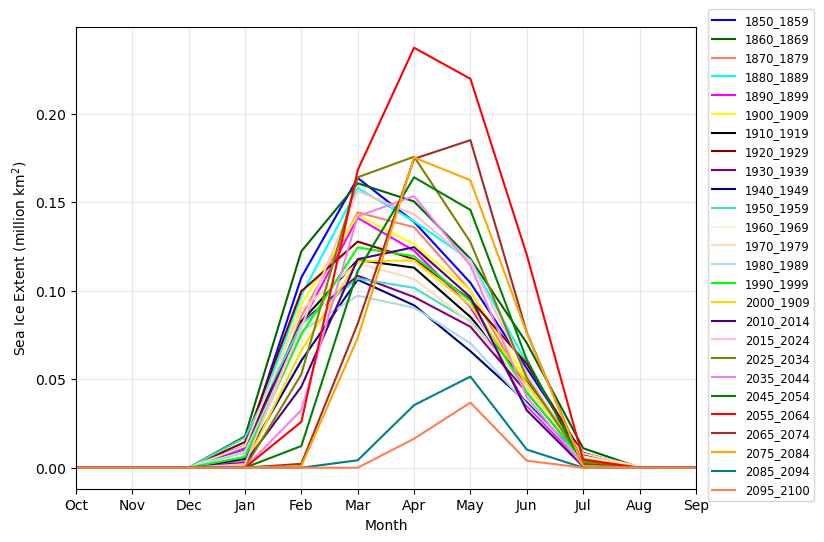

In [46]:
# Set xticks to represent months from January to December
fig,ax=plt.subplots(figsize=(8,6))
all_data=[aice_1850_59_monthly,aice_1860_69_monthly,aice_1870_79_monthly,aice_1880_89_monthly,aice_1890_99_monthly,
          aice_1900_09_monthly,aice_1910_19_monthly,aice_1920_29_monthly,aice_1930_39_monthly,aice_1940_49_monthly,
          aice_1950_59_monthly,aice_1960_69_monthly,aice_1970_79_monthly,aice_1980_89_monthly,aice_1990_99_monthly,
          aice_2000_09_monthly,aice_2010_14_monthly,aice_2015_24_monthly,aice_2025_34_monthly,aice_2035_44_monthly,
          aice_2045_54_monthly,aice_2055_64_monthly,aice_2065_74_monthly,aice_2075_84_monthly,aice_2085_94_monthly,
          aice_2095_100_monthly]
        
labels = ['1850_1859', '1860_1869', '1870_1879', '1880_1889', '1890_1899', '1900_1909', '1910_1919',
          '1920_1929', '1930_1939', '1940_1949', '1950_1959', '1960_1969', '1970_1979', '1980_1989',
          '1990_1999', '2000_2009', '2010_20', '2015_2024', '2025_2034', '2035_2044', '2045_2054',
          '2055_2064', '2065_2074', '2075_2084', '2085_2094', '2095_2100']


colors = ['blue', 'darkgreen', 'salmon', 'cyan', 'magenta', 'yellow', 'black', 'maroon', 
          'purple',  'navy', 'turquoise','beige', 'peachpuff', 'lightblue', 'lime', 'gold',
          'indigo', 'pink', 'olive','violet', 'green', 'red',  'brown',
          'orange', 'teal', 'coral']

for i in range(len(all_data)):
    linestyle = '-'  # Default linestyle
    ax.plot((np.append(all_data[i][9:],all_data[i][:9])), color=colors[i], linestyle=linestyle,
             label=labels[i])
plt.xticks(np.arange(0,12), ['Oct','Nov','Dec','Jan','Feb','Mar','Apr','May','Jun','Jul','Aug',
                             'Sep',])
plt.xlabel('Month')
plt.ylabel('Sea Ice Extent (million km$^2$)')
#plt.title('Seasonal Cycle of Sea Ice Extent \n(EM 1001-001)', fontweight='bold')
#plt.plot(np.max(all_data[i].values))
plt.legend(loc='best',fontsize='small',bbox_to_anchor=(1.2, 1.05))
plt.xlim(0, 11)
plt.grid(alpha=0.3)
plt.savefig('season-area1.jpg',dpi=300, bbox_inches='tight')

plt.show()

#panarctic 

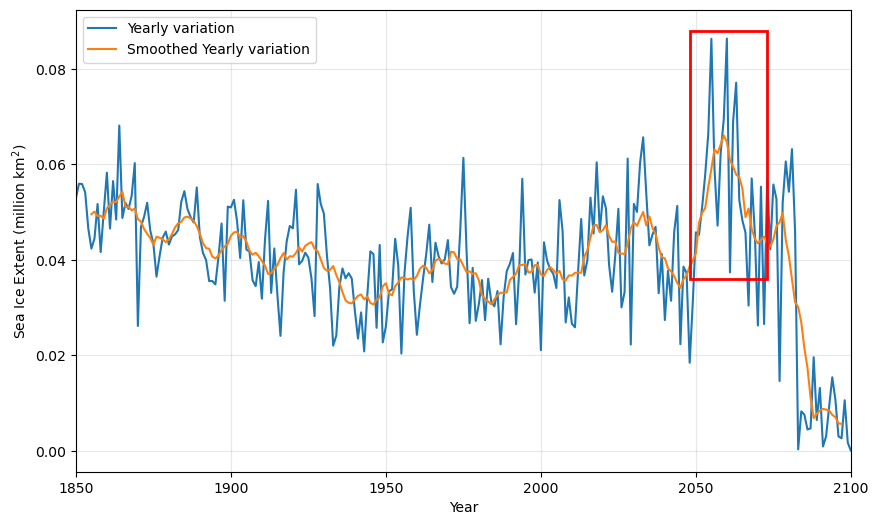

In [47]:
fig, ax=plt.subplots(figsize=(10,6))
# Compute the yearly mean ice area
yearly_mean = aice_region.groupby('time.year').mean('time').sum(('nj', 'ni'))

# Calculate the mean across all yearsa
overall_mean = yearly_mean.mean('year')
#print(overall_mean)
# Create an array with the same size as the number of years with the overall mean value
mean_line = np.full_like(yearly_mean, overall_mean)
# Plot the yearly variations and the mean line
ax.plot(yearly_mean.year, yearly_mean, label='Yearly variation')
plt.plot(yearly_mean.year, mean_line, label='Mean Variation', linestyle='--')
ax.plot(yearly_mean.year, yearly_mean.rolling(year=10, center=True).mean(), label='Smoothed Yearly variation')
rect=ax.add_patch(Rectangle((2048, 0.036), 25, 0.052, edgecolor='red',facecolor='none',lw=2,))
rect.set_zorder(10)
plt.xlabel('Year')
#plt.title('Yearly Mean Sea Ice Extent \n(EM 1001-001)', fontweight='bold')
plt.ylabel('Sea Ice Extent (million km$^2$)')
plt.legend()
plt.xlim(1850,2100)
plt.grid(alpha=0.3)
plt.savefig(path+'/plots/'+'plot2.jpg',dpi=300, bbox_inches='tight')
plt.show()

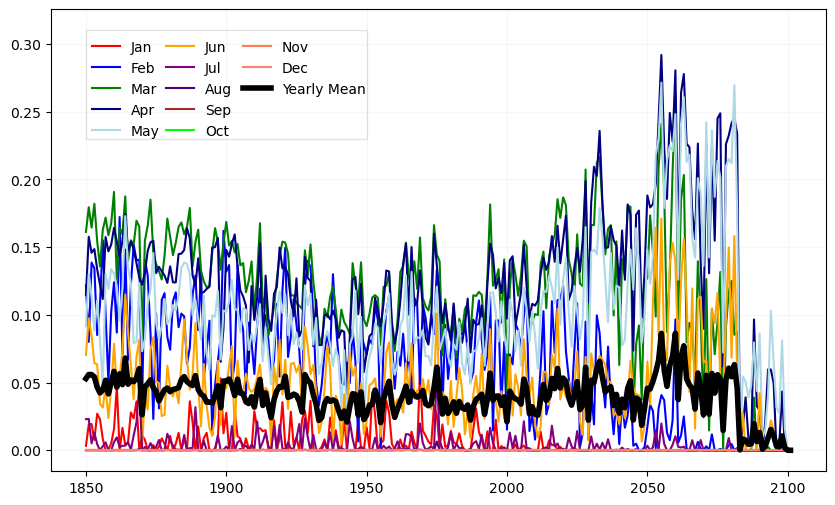

In [48]:
fig, ax=plt.subplots(figsize=(10,6))
# Compute the yearly mean ice area
#yearly_mean = aice_region.groupby('time.year').mean('time')
yearly_mean = aice_region.groupby('time.year').mean('time').sum(('nj', 'ni'))
jan_data=aice_region[11::12].sum(('nj', 'ni'))
feb_data=aice_region[0::12].sum(('nj', 'ni'))
mar_data=aice_region[1::12].sum(('nj', 'ni'))
apr_data=aice_region[2::12].sum(('nj', 'ni'))
may_data=aice_region[3::12].sum(('nj', 'ni'))
jun_data=aice_region[4::12].sum(('nj', 'ni'))
jul_data=aice_region[5::12].sum(('nj', 'ni'))
aug_data=aice_region[6::12].sum(('nj', 'ni'))
sep_data=aice_region[7::12].sum(('nj', 'ni'))
oct_data=aice_region[8::12].sum(('nj', 'ni'))
nov_data=aice_region[9::12].sum(('nj', 'ni'))
dec_data=aice_region[10::12].sum(('nj', 'ni'))

# Calculate the mean across all years
#overall_mean = yearly_mean.mean('year')
#print(overall_mean)
# Create an array with the same size as the number of years with the overall mean value
#mean_line = np.full_like(yearly_mean, overall_mean)
# Plot the yearly variations and the mean line

ax.plot(np.arange(1850,2101), jan_data, label='Jan', color='red')
ax.plot(np.arange(1850,2101), feb_data, label='Feb', color='blue')
ax.plot(np.arange(1850,2101), mar_data, label='Mar', color='green')
ax.plot(np.arange(1850,2101), apr_data, label='Apr', color='navy')
ax.plot(np.arange(1850,2101), may_data, label='May', color='lightblue')
ax.plot(np.arange(1850,2101), jun_data, label='Jun', color='orange')
ax.plot(np.arange(1850,2101), jul_data, label='Jul', color='purple')
ax.plot(np.arange(1850,2101), aug_data, label='Aug', color='indigo')
ax.plot(np.arange(1850,2101), sep_data, label='Sep', color='brown')
ax.plot(np.arange(1850,2101), oct_data, label='Oct', color='lime')
ax.plot(np.arange(1850,2101), nov_data, label='Nov', color='coral')
ax.plot(np.arange(1850,2101), dec_data, label='Dec', color='Salmon')
ax.plot(np.arange(1850,2102), yearly_mean, label='Yearly Mean', color='black', linewidth=4)
rect=ax.add_patch(Rectangle((1850, 0.23), 100, 0.08, edgecolor='k',facecolor='None',alpha=0.11,lw=1, ))
#rect.set_zorder(10)
#plt.xticks(np.arange(1850,2100))
plt.grid(alpha=0.1)
handles, labels = plt.gca().get_legend_handles_labels()

# Create two legends
legend1=plt.legend(handles[:5],labels[:5],loc='upper left',bbox_to_anchor=(0.037, 0.96),frameon=False)
legend2=plt.legend(handles[5:10],labels[5:10],loc='upper left',bbox_to_anchor=(0.133, 0.96),frameon=False)
legend3=plt.legend(handles[10:],labels[10:],loc='upper left',bbox_to_anchor=(0.232, 0.96),frameon=False)


# Add the first legend manually to the current Axes
plt.gca().add_artist(legend1)
plt.gca().add_artist(legend2)

#plt.savefig('year-area1.jpg',dpi=300, bbox_inches='tight')
plt.show()

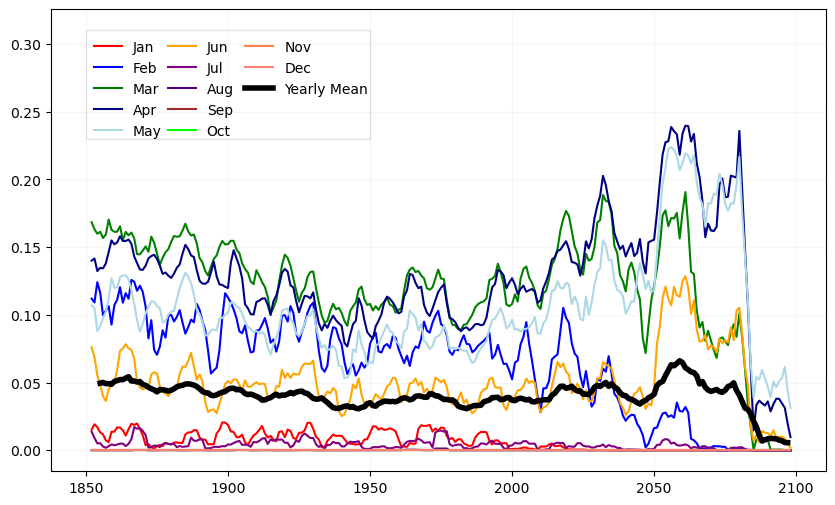

In [49]:
fig, ax=plt.subplots(figsize=(10,6))
# Compute the yearly mean ice area
#yearly_mean = aice_region.groupby('time.year').mean('time')
yearly_mean = aice_region.groupby('time.year').mean('time').sum(('nj', 'ni'))
jan_data=aice_region[11::12].sum(('nj', 'ni'))
feb_data=aice_region[0::12].sum(('nj', 'ni'))
mar_data=aice_region[1::12].sum(('nj', 'ni'))
apr_data=aice_region[2::12].sum(('nj', 'ni'))
may_data=aice_region[3::12].sum(('nj', 'ni'))
jun_data=aice_region[4::12].sum(('nj', 'ni'))
jul_data=aice_region[5::12].sum(('nj', 'ni'))
aug_data=aice_region[6::12].sum(('nj', 'ni'))
sep_data=aice_region[7::12].sum(('nj', 'ni'))
oct_data=aice_region[8::12].sum(('nj', 'ni'))
nov_data=aice_region[9::12].sum(('nj', 'ni'))
dec_data=aice_region[10::12].sum(('nj', 'ni'))

# Calculate the mean across all years
#overall_mean = yearly_mean.mean('year')
#print(overall_mean)
# Create an array with the same size as the number of years with the overall mean value
#mean_line = np.full_like(yearly_mean, overall_mean)
# Plot the yearly variations and the mean line


ax.plot(np.arange(1850,2101), jan_data.rolling(time=5, center=True).mean(), label='Jan', color='red')
ax.plot(np.arange(1850,2101), feb_data.rolling(time=5, center=True).mean(), label='Feb', color='blue')
ax.plot(np.arange(1850,2101), mar_data.rolling(time=5, center=True).mean(), label='Mar', color='green')
ax.plot(np.arange(1850,2101), apr_data.rolling(time=5, center=True).mean(), label='Apr', color='navy')
ax.plot(np.arange(1850,2101), may_data.rolling(time=5, center=True).mean(), label='May', color='lightblue')
ax.plot(np.arange(1850,2101), jun_data.rolling(time=5, center=True).mean(), label='Jun', color='orange')
ax.plot(np.arange(1850,2101), jul_data.rolling(time=5, center=True).mean(), label='Jul', color='purple')
ax.plot(np.arange(1850,2101), aug_data.rolling(time=5, center=True).mean(), label='Aug', color='indigo')
ax.plot(np.arange(1850,2101), sep_data.rolling(time=5, center=True).mean(), label='Sep', color='brown')
ax.plot(np.arange(1850,2101), oct_data.rolling(time=5, center=True).mean(), label='Oct', color='lime')
ax.plot(np.arange(1850,2101), nov_data.rolling(time=5, center=True).mean(), label='Nov', color='coral')
ax.plot(np.arange(1850,2101), dec_data.rolling(time=5, center=True).mean(), label='Dec', color='Salmon')
ax.plot(np.arange(1850,2102), yearly_mean.rolling(year=10,center=True).mean(),label='Yearly Mean',color='black',
        linewidth=4)
rect=ax.add_patch(Rectangle((1850, 0.23), 100, 0.08, edgecolor='k',facecolor='None',alpha=0.11,lw=1, ))
#rect.set_zorder(10)
#plt.xticks(np.arange(1850,2100))
plt.grid(alpha=0.1)
handles, labels = plt.gca().get_legend_handles_labels()

# Create two legends
legend1=plt.legend(handles[:5],labels[:5],loc='upper left',bbox_to_anchor=(0.04, 0.96),frameon=False)
legend2=plt.legend(handles[5:10],labels[5:10],loc='upper left',bbox_to_anchor=(0.135, 0.96),frameon=False)
legend3=plt.legend(handles[10:],labels[10:],loc='upper left',bbox_to_anchor=(0.235, 0.96),frameon=False)


# Add the first legend manually to the current Axes
plt.gca().add_artist(legend1)
plt.gca().add_artist(legend2)

#plt.savefig('year-area1.jpg',dpi=300, bbox_inches='tight')
plt.show()

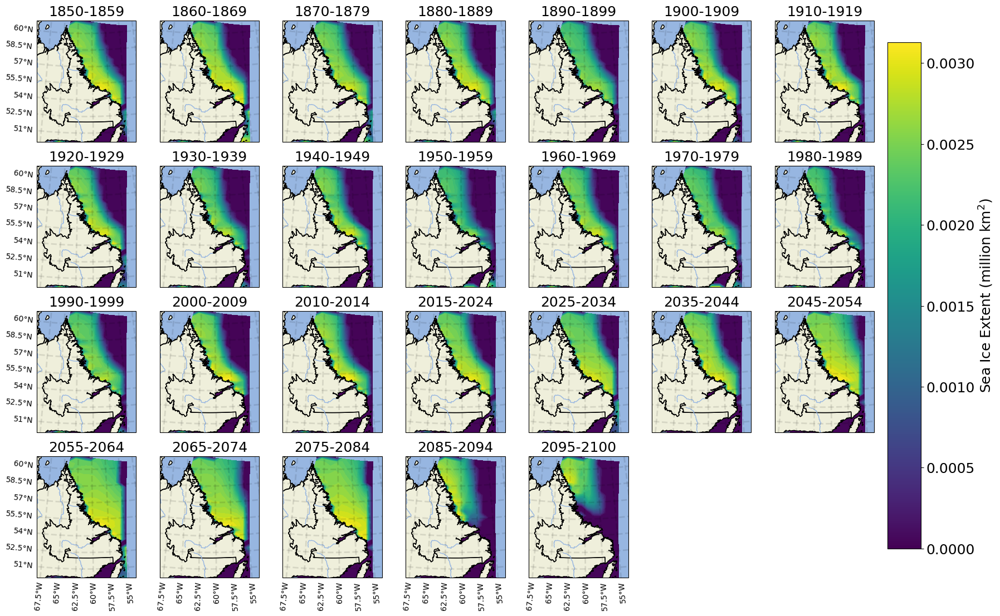

In [50]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(20,13))

selected_data = [aice_1850_59, aice_1860_69, aice_1870_79, aice_1880_89, aice_1890_99, aice_1900_09, aice_1910_19,
                 aice_1920_29, aice_1930_39, aice_1940_49, aice_1950_59, aice_1960_69, aice_1970_79, aice_1980_89,
                 aice_1990_99, aice_2000_09, aice_2010_14, aice_2015_24, aice_2025_34, aice_2035_44, aice_2045_54,
                 aice_2055_64, aice_2065_74, aice_2075_84, aice_2085_94, aice_2095_100]

titles = ['1850-1859', '1860-1869', '1870-1879', '1880-1889', '1890-1899', '1900-1909', '1910-1919',
          '1920-1929', '1930-1939', '1940-1949', '1950-1959', '1960-1969', '1970-1979', '1980-1989',
          '1990-1999', '2000-2009', '2010-2014', '2015-2024', '2025-2034', '2035-2044', '2045-2054',
          '2055-2064', '2065-2074', '2075-2084', '2085-2094', '2095-2100']

global_min = np.min([np.min(data.max('time').values) for data in selected_data])
global_max = np.max([np.max(data.max('time').values) for data in selected_data])
norm = plt.Normalize(vmin=global_min, vmax=global_max)
cb=cm.ScalarMappable(norm=norm)

x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(4,7, i+1, projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                                central_latitude=c_lat,
                                                                standard_parallels=(y0, y1)))
    ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i].max('time'),
                   levels=45,transform=ccrs.PlateCarree())
    ax.set_title(titles[i], fontsize=18)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    #vertices = [(lon, y0) for lon in range(x0, x1+1, 1)] + [(lon, y1) for lon in range(x1, x0-1, -1)]
    #boundary = mpath.Path(vertices)
    #ax.set_boundary(boundary, transform=ccrs.PlateCarree())
    
    #ax.set_extent([-65,-55,50.5,61])
    if i in [21,22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.1, linestyle='--',
                          transform=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left = True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(0.45, -0.46, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            #rotation_mode='anchor',fontsize=15, transform=ax.transAxes)
    if i not in [21,22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.1, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()

    if i in [0,7,14,21]:
        gl = ax.gridlines(draw_labels=False, linewidth=0, color='black', alpha=0.00, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(-0.45, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                #rotation_mode='anchor',fontsize=15, transform=ax.transAxes)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar=fig.colorbar(cb, cax=cbar_ax,ax=ax, orientation='vertical',label='Sea Ice Extent (million km$^2$)')
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_ylabel('Sea Ice Extent (million km$^2$)', fontsize=18)  # Adjust the font size (e.g., 14)

#plt.suptitle('Maximum Sea Ice Extent\n(EM 1001-001)',y=0.96, fontsize=24, fontweight='bold')
plt.subplots_adjust(wspace=-0.018)
#plt.subplots_adjust(hspace=0.1)
plt.savefig('max_spat_area1.jpg',dpi=300, bbox_inches='tight')
plt.show()

#sea ice concentration done
#spatial plot for both cis and cesm2-le 
#monthly done

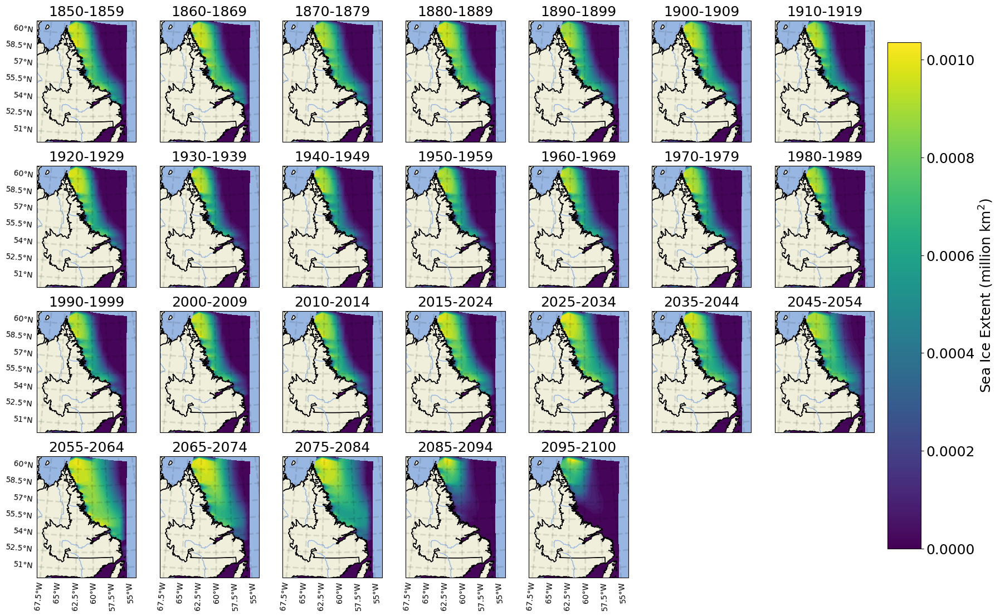

In [51]:
#=================max=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(20,13))

selected_data = [aice_1850_59, aice_1860_69, aice_1870_79, aice_1880_89, aice_1890_99, aice_1900_09, aice_1910_19,
                 aice_1920_29, aice_1930_39, aice_1940_49, aice_1950_59, aice_1960_69, aice_1970_79, aice_1980_89,
                 aice_1990_99, aice_2000_09, aice_2010_14, aice_2015_24, aice_2025_34, aice_2035_44, aice_2045_54,
                 aice_2055_64, aice_2065_74, aice_2075_84, aice_2085_94, aice_2095_100]

titles = ['1850-1859', '1860-1869', '1870-1879', '1880-1889', '1890-1899', '1900-1909', '1910-1919',
          '1920-1929', '1930-1939', '1940-1949', '1950-1959', '1960-1969', '1970-1979', '1980-1989',
          '1990-1999', '2000-2009', '2010-2014', '2015-2024', '2025-2034', '2035-2044', '2045-2054',
          '2055-2064', '2065-2074', '2075-2084', '2085-2094', '2095-2100']

global_min = np.min([np.min(data.mean('time').values) for data in selected_data])
global_max = np.max([np.max(data.mean('time').values) for data in selected_data])
norm = plt.Normalize(vmin=global_min, vmax=global_max)
cb=cm.ScalarMappable(norm=norm)

x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(4,7, i+1, projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                                central_latitude=c_lat,
                                                                standard_parallels=(y0, y1)))
    ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i].mean('time'),
                   levels=45,transform=ccrs.PlateCarree())
    ax.set_title(titles[i], fontsize=18)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    #vertices = [(lon, y0) for lon in range(x0, x1+1, 1)] + [(lon, y1) for lon in range(x1, x0-1, -1)]
    #boundary = mpath.Path(vertices)
    #ax.set_boundary(boundary, transform=ccrs.PlateCarree())
    
    #ax.set_extent([-65,-55,50.5,61])
    if i in [21,22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.1, linestyle='--',
                          transform=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left = True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(0.45, -0.46, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            #rotation_mode='anchor',fontsize=15, transform=ax.transAxes)
    if i not in [21,22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.1, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()

    if i in [0,7,14,21]:
        gl = ax.gridlines(draw_labels=False, linewidth=0, color='black', alpha=0.00, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(-0.45, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                #rotation_mode='anchor',fontsize=15, transform=ax.transAxes)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar=fig.colorbar(cb, cax=cbar_ax,ax=ax, orientation='vertical',label='Sea Ice Extent (million km$^2$)')
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_ylabel('Sea Ice Extent (million km$^2$)', fontsize=18)  # Adjust the font size (e.g., 14)

#plt.suptitle('Mean Sea Ice Extent\n(EM 1001-001)',y=0.96, fontsize=24, fontweight='bold')
plt.subplots_adjust(wspace=-0.018)
#plt.subplots_adjust(hspace=0.1)
plt.savefig('spat-area2.jpg',dpi=300, bbox_inches='tight')
plt.show()

In [52]:
aice_months=aice_region.groupby('time.month').mean('time')
aice_months

<xarray.DataArray (month: 12, nj: 29, ni: 12)>
dask.array<stack, shape=(12, 29, 12), dtype=float32, chunksize=(1, 29, 12), chunktype=numpy.ndarray>
Coordinates:
    TLON     (nj, ni) float32 dask.array<chunksize=(29, 12), meta=np.ndarray>
    TLAT     (nj, ni) float32 dask.array<chunksize=(29, 12), meta=np.ndarray>
    ULON     (nj, ni) float32 dask.array<chunksize=(29, 12), meta=np.ndarray>
    ULAT     (nj, ni) float32 dask.array<chunksize=(29, 12), meta=np.ndarray>
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nj, ni

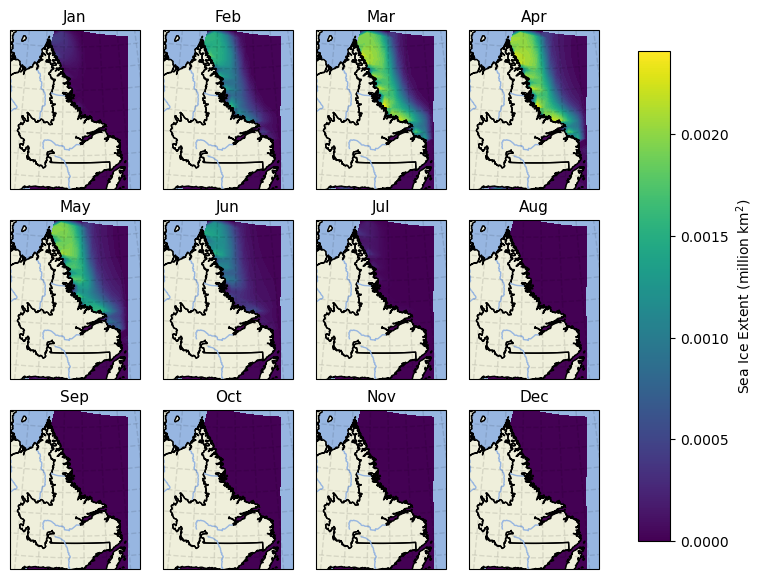

In [53]:
# Create a figure with two subplots
fig = plt.figure(figsize=(8,7))

selected_data=[aice_months[0],aice_months[1],aice_months[2],aice_months[3],aice_months[4],aice_months[5],
              aice_months[6],aice_months[7],aice_months[8],aice_months[9],aice_months[10],aice_months[11]]

titles = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

global_min = np.min([np.min(data.values) for data in selected_data])
global_max = np.max([np.max(data.values) for data in selected_data])
norm = plt.Normalize(vmin=global_min, vmax=global_max)
cb=cm.ScalarMappable(norm=norm)

x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(3,4, i+1, projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                                central_latitude=c_lat,
                                                                standard_parallels=(y0, y1)))
    ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i], norm=norm,
                   levels=45, transform=ccrs.PlateCarree())
    ax.set_title(titles[i], fontsize=11)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    #vertices = [(lon, y0) for lon in range(x0, x1+1, 1)] + [(lon, y1) for lon in range(x1, x0-1, -1)]
    #boundary = mpath.Path(vertices)
    #ax.set_boundary(boundary, transform=ccrs.PlateCarree())
    #ax.set_extent([-65,-55,50.5,61])
    gl = ax.gridlines(draw_labels=False, linewidth=1, color='black', alpha=0.1, linestyle='--',
                          transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    
    
'''
    if i in [8,9,10,11]:
        gl = ax.gridlines(draw_labels=True, linewidth=1, color='black', alpha=0.1, linestyle='--',
                          transform=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left = True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(0.45, -0.7, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            #rotation_mode='anchor', transform=ax.transAxes)
    if i not in [8,9,10,11]:
        gl = ax.gridlines(draw_labels=True, linewidth=1, color='black', alpha=0.1, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()

    if i in [0,4,8]:
        gl = ax.gridlines(draw_labels=False, linewidth=0, color='black', alpha=0.00, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(-0.7, 0.5, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                #rotation_mode='anchor', transform=ax.transAxes)
'''


cbar_ax = fig.add_axes([0.93, 0.15, 0.04, 0.7])
cbar=fig.colorbar(cb, cax=cbar_ax, ax=ax, orientation='vertical',label='Sea Ice Extent (million km$^2$)')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_ylabel('SIC (%)', fontsize=18)  # Adjust the font size (e.g., 14)

#plt.suptitle('Maximum Sea Ice Extent\n(EM 1001-001)',y=0.96, fontsize=24, fontweight='bold')
plt.subplots_adjust(wspace=-0.05)
plt.subplots_adjust(hspace=0.2)
plt.savefig('spat-area3.jpg',dpi=300, bbox_inches='tight')
plt.show()

#sea ice concentration
#spatial plot for both cis and cesm2-le
#monthly

##### sea ice concentration

In [7]:
#sic_region=aice__region.where(aice__region>0,0)
sic_region=aice__region.where(aice__region>0,0)

In [8]:
#Hist
sic_1850_59 = sic_region.sel(time=slice('1850-02-01','1860-01-01'))
sic_1860_69 = sic_region.sel(time=slice('1860-02-01','1870-01-01'))
sic_1870_79 = sic_region.sel(time=slice('1870-02-01','1880-01-01'))
sic_1880_89 = sic_region.sel(time=slice('1880-02-01','1890-01-01'))
sic_1890_99 = sic_region.sel(time=slice('1890-02-01','1900-01-01'))
sic_1900_09 = sic_region.sel(time=slice('1900-02-01','1910-01-01'))
sic_1910_19 = sic_region.sel(time=slice('1910-02-01','1920-01-01'))
sic_1920_29 = sic_region.sel(time=slice('1920-02-01','1930-01-01'))
sic_1930_39 = sic_region.sel(time=slice('1930-02-01','1940-01-01'))
sic_1940_49 = sic_region.sel(time=slice('1940-02-01','1950-01-01'))
sic_1950_59 = sic_region.sel(time=slice('1950-02-01','1960-01-01'))
sic_1960_69 = sic_region.sel(time=slice('1960-02-01','1970-01-01'))
sic_1970_79 = sic_region.sel(time=slice('1970-02-01','1980-01-01'))
sic_1980_89 = sic_region.sel(time=slice('1980-02-01','1990-01-01'))
sic_1990_99 = sic_region.sel(time=slice('1990-02-01','2000-01-01'))
sic_2000_09 = sic_region.sel(time=slice('2000-02-01','2010-01-01'))
sic_2010_14 = sic_region.sel(time=slice('2010-02-01','2015-01-01'))

#Future
sic_2015_24 = sic_region.sel(time=slice('2015-02-01','2025-01-01'))
sic_2025_34 = sic_region.sel(time=slice('2025-02-01','2035-01-01'))
sic_2035_44 = sic_region.sel(time=slice('2035-02-01','2045-01-01'))
sic_2045_54 = sic_region.sel(time=slice('2045-02-01','2055-01-01'))
sic_2055_64 = sic_region.sel(time=slice('2055-02-01','2065-01-01'))
sic_2065_74 = sic_region.sel(time=slice('2065-02-01','2075-01-01'))
sic_2075_84 = sic_region.sel(time=slice('2075-02-01','2085-01-01'))
sic_2085_94 = sic_region.sel(time=slice('2085-02-01','2095-01-01'))
sic_2095_100 =sic_region.sel(time=slice('2095-02-01','2101-01-01'))

In [ ]:
#=========sic_region==mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(20,13))

selected_data = [sic_1850_59, sic_1860_69, sic_1870_79, sic_1880_89, sic_1890_99, sic_1900_09, sic_1910_19,
                 sic_1920_29, sic_1930_39, sic_1940_49, sic_1950_59, sic_1960_69, sic_1970_79, sic_1980_89,
                 sic_1990_99, sic_2000_09, sic_2010_14, sic_2015_24, sic_2025_34, sic_2035_44, sic_2045_54,
                 sic_2055_64, sic_2065_74, sic_2075_84, sic_2085_94, sic_2095_100]

titles = ['1850-1859', '1860-1869', '1870-1879', '1880-1889', '1890-1899', '1900-1909', '1910-1919',
          '1920-1929', '1930-1939', '1940-1949', '1950-1959', '1960-1969', '1970-1979', '1980-1989',
          '1990-1999', '2000-2009', '2010-2014', '2015-2024', '2025-2034', '2035-2044', '2045-2054',
          '2055-2064', '2065-2074', '2075-2084', '2085-2094', '2095-2100']

global_min = np.min([np.nanmin(data.mean('time').values) for data in selected_data])
global_max = np.max([np.nanmax(data.mean('time').values) for data in selected_data])
norm = plt.Normalize(vmin=global_min*100, vmax=global_max*100)
cb=cm.ScalarMappable(norm=norm)

x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(4,7, i+1, projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                                central_latitude=c_lat,
                                                                standard_parallels=(y0, y1)))
    ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i].mean('time')*100,levels=45, norm=norm,
                transform=ccrs.PlateCarree())
    ax.set_title(titles[i], fontsize=18)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    #vertices = [(lon, y0) for lon in range(x0, x1+1, 1)] + [(lon, y1) for lon in range(x1, x0-1, -1)]
    #boundary = mpath.Path(vertices)
    #ax.set_boundary(boundary, transform=ccrs.PlateCarree())
    
    #ax.set_extent([-65,-55,50.5,61])
    if i in [21,22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.1, linestyle='--',
                          transform=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left = True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(0.45, -0.46, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            #rotation_mode='anchor',fontsize=15, transform=ax.transAxes)
    if i not in [21,22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.1, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()

    if i in [0,7,14,21]:
        gl = ax.gridlines(draw_labels=False, linewidth=0, color='black', alpha=0.00, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(-0.45, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                #rotation_mode='anchor',fontsize=15, transform=ax.transAxes)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar=fig.colorbar(cb, cax=cbar_ax, ax=ax, orientation='vertical',label='SIC (%)')
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_ylabel('SIC (%)', fontsize=18)  # Adjust the font size (e.g., 14)

#plt.suptitle('Maximum Sea Ice Extent\n(EM 1001-001)',y=0.96, fontsize=24, fontweight='bold')
plt.subplots_adjust(wspace=-0.018)
#plt.subplots_adjust(hspace=0.1)
plt.savefig('max_spat_SIC.jpg',dpi=300, bbox_inches='tight')
plt.show()

#sea ice concentration
#spatial plot for both cis and cesm2-le
#monthly

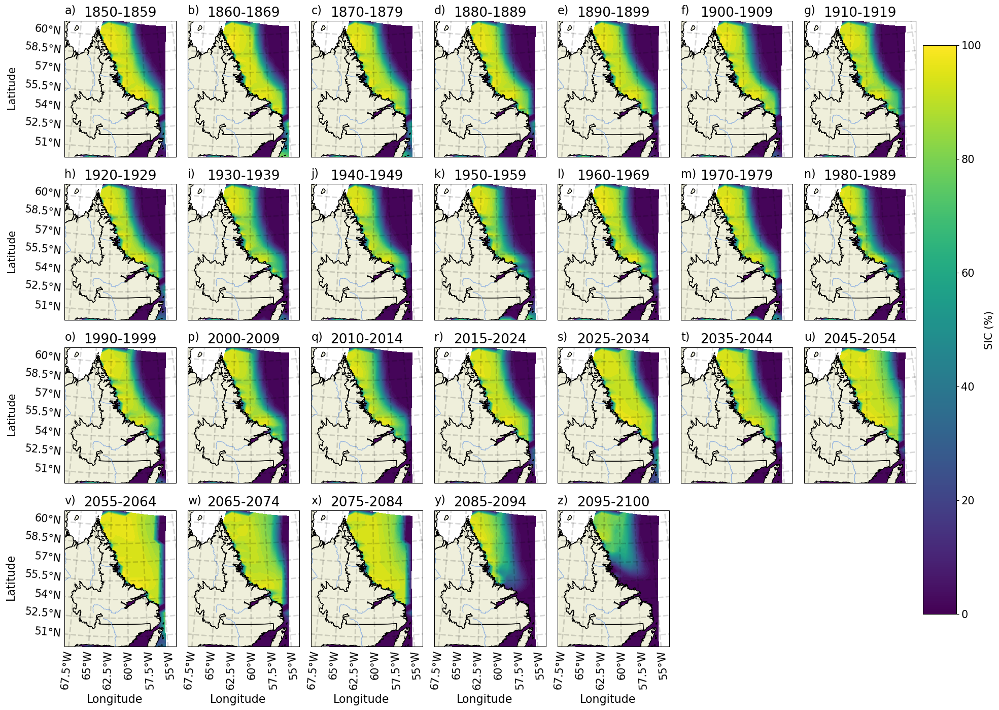

In [13]:
#=========sic_region==max=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(22,16))

selected_data = [sic_1850_59, sic_1860_69, sic_1870_79, sic_1880_89, sic_1890_99, sic_1900_09, sic_1910_19,
                 sic_1920_29, sic_1930_39, sic_1940_49, sic_1950_59, sic_1960_69, sic_1970_79, sic_1980_89,
                 sic_1990_99, sic_2000_09, sic_2010_14, sic_2015_24, sic_2025_34, sic_2035_44, sic_2045_54,
                 sic_2055_64, sic_2065_74, sic_2075_84, sic_2085_94, sic_2095_100]
name=['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)', 'j)', 'k)', 'l)', 'm)', 'n)', 'o)', 'p)', 'q)',
      'r)', 's)', 't)', 'u)', 'v)', 'w)', 'x)', 'y)', 'z)']

titles = ['1850-1859', '1860-1869', '1870-1879', '1880-1889', '1890-1899', '1900-1909', '1910-1919',
          '1920-1929', '1930-1939', '1940-1949', '1950-1959', '1960-1969', '1970-1979', '1980-1989',
          '1990-1999', '2000-2009', '2010-2014', '2015-2024', '2025-2034', '2035-2044', '2045-2054',
          '2055-2064', '2065-2074', '2075-2084', '2085-2094', '2095-2100']

#global_min = np.min([np.min(data.max('time').values) for data in selected_data])
#global_max = np.max([np.max(data.max('time').values) for data in selected_data])
norm = plt.Normalize(0, 100)
cb=cm.ScalarMappable(norm=norm)

x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(4,7, i+1, projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                                central_latitude=c_lat,
                                                                standard_parallels=(y0, y1)))
    ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i].max('time')*100, norm=norm,
                   levels=45, transform=ccrs.PlateCarree())
    ax.set_title(titles[i], fontsize=19)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    #ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    ax.text(0,1.05,name[i], transform=ax.transAxes, fontsize=16)
    
    if i in [22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.15, linestyle='--',
                          transform=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left = True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        ax.text(0.45, -0.43, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            rotation_mode='anchor',fontsize=16, transform=ax.transAxes)
    if i not in [22,23,24,25]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.15, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
    
    if i in [21]:
        gl = ax.gridlines(draw_labels=False, linewidth=0, color='black', alpha=0.00, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  True, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        ax.text(-0.43, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                rotation_mode='anchor',fontsize=16, transform=ax.transAxes)
        ax.text(0.45, -0.43, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            rotation_mode='anchor',fontsize=16, transform=ax.transAxes)

    if i in [0,7,14]:
        gl = ax.gridlines(draw_labels=False, linewidth=0, color='black', alpha=0.00, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        ax.text(-0.43, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                rotation_mode='anchor',fontsize=15, transform=ax.transAxes)
    gl.xlabel_style = {'size': 15}
    gl.ylabel_style = {'size': 15}
                
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar=fig.colorbar(cb, cax=cbar_ax, ax=ax, orientation='vertical',label='SIC (%)')
cbar.ax.tick_params(labelsize=15)
cbar.ax.set_ylabel('SIC (%)', fontsize=15)  

plt.subplots_adjust(wspace=-0.018)
plt.savefig(path+'/plots/'+'plot3.jpg',dpi=300, bbox_inches='tight')
plt.show()


In [9]:
sic_months=sic_region.groupby('time.month').max('time')

In [ ]:
# Create a figure with two subplots
fig = plt.figure(figsize=(8,7))

selected_data=[sic_months[0],sic_months[1],sic_months[2],sic_months[3],sic_months[4],sic_months[5],
              sic_months[6],sic_months[7],sic_months[8],sic_months[9],sic_months[10],sic_months[11]]

titles = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

global_min = np.min([np.nanmin(data.values) for data in selected_data])
global_max = np.max([np.nanmax(data.values) for data in selected_data])
norm = plt.Normalize(vmin=global_min*100, vmax=global_max*100)
cb=cm.ScalarMappable(norm=norm)

x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(3,4, i+1, projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                                central_latitude=c_lat,
                                                                standard_parallels=(y0, y1)))
    ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i]*100, norm=norm, transform=ccrs.PlateCarree())
    ax.set_title(titles[i], fontsize=11)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    #vertices = [(lon, y0) for lon in range(x0, x1+1, 1)] + [(lon, y1) for lon in range(x1, x0-1, -1)]
    #boundary = mpath.Path(vertices)
    #ax.set_boundary(boundary, transform=ccrs.PlateCarree())
    #ax.set_extent([-65,-55,50.5,61])
    gl = ax.gridlines(draw_labels=False, linewidth=1, color='black', alpha=0.1, linestyle='--',
                          transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    
    
'''
    if i in [8,9,10,11]:
        gl = ax.gridlines(draw_labels=True, linewidth=1, color='black', alpha=0.1, linestyle='--',
                          transform=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left = True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(0.45, -0.7, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            #rotation_mode='anchor', transform=ax.transAxes)
    if i not in [8,9,10,11]:
        gl = ax.gridlines(draw_labels=True, linewidth=1, color='black', alpha=0.1, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()

    if i in [0,4,8]:
        gl = ax.gridlines(draw_labels=False, linewidth=0, color='black', alpha=0.00, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        #ax.text(-0.7, 0.5, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                #rotation_mode='anchor', transform=ax.transAxes)
'''


cbar_ax = fig.add_axes([0.93, 0.15, 0.04, 0.7])
cbar=fig.colorbar(cb, cax=cbar_ax, ax=ax, orientation='vertical',label='SIC (%)')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_ylabel('SIC (%)', fontsize=18)  # Adjust the font size (e.g., 14)

#plt.suptitle('Maximum Sea Ice Extent\n(EM 1001-001)',y=0.96, fontsize=24, fontweight='bold')
plt.subplots_adjust(wspace=-0.05)
plt.subplots_adjust(hspace=0.2)
plt.savefig('max_spat_SICmon.jpg',dpi=300, bbox_inches='tight')
plt.show()

#sea ice concentration
#spatial plot for both cis and cesm2-le
#monthly

In [10]:
sic_months=sic_region.groupby('time.month').mean('time')

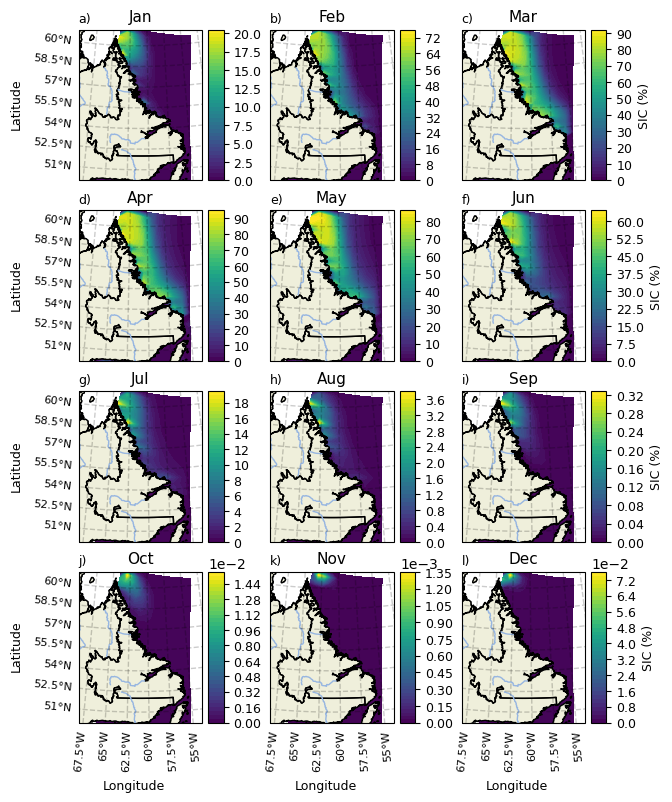

In [11]:
# Create a figure with two# Create a figure with two subplots
fig = plt.figure(figsize=(7,9))

selected_data=[sic_months[0],sic_months[1],sic_months[2],sic_months[3],sic_months[4],sic_months[5],
              sic_months[6],sic_months[7],sic_months[8],sic_months[9],sic_months[10],sic_months[11]]
titles = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
name=['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)','l)']


x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
#for i in range(3):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(4,3, i+1,projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                              central_latitude=c_lat,standard_parallels=(y0, y1)))
    ax.set_title(titles[i], fontsize=11)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    #ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    ax.text(0,1.05,name[i], transform=ax.transAxes, fontsize=9)
    
    
    contf=ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i]*100,vmin=0,levels=45,
                   vmax=np.nanmax(selected_data[i].values)*100,transform=ccrs.PlateCarree(), )
    gl = ax.gridlines(draw_labels=False, linewidth=1, color='black', alpha=0.2, linestyle='--',
                          transform=ccrs.PlateCarree())
    cbar=fig.colorbar(contf, ax=ax,aspect=10, pad=0.04,shrink=1 )
    cbar.ax.tick_params(labelsize=9)
    cb = cbar
    
    if i in [0,3,6]:
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        ax.text(-0.45, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
    
    if i in [2,5,8,11]:
        cbar.ax.set_ylabel('SIC (%)', fontsize=9)
        
    if i in [9]:
        ax.text(0.45, -0.46, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
        ax.text(-0.45, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
        gl.xlabels_bottom, gl.ylabels_left =  True, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        cb.formatter.set_powerlimits((0, 0))
        cb.ax.yaxis.set_offset_position('left')
        cb.update_ticks()
        
    if i in [10,11]:
        ax.text(0.45, -0.46, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
        gl.xlabels_bottom, gl.ylabels_left =  True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        cb.formatter.set_powerlimits((0, 0))
        cb.ax.yaxis.set_offset_position('left')
        cb.update_ticks()
        
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}

plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)
plt.savefig(path+'/plots/'+'plot4.jpg',dpi=300, bbox_inches='tight')
plt.show()

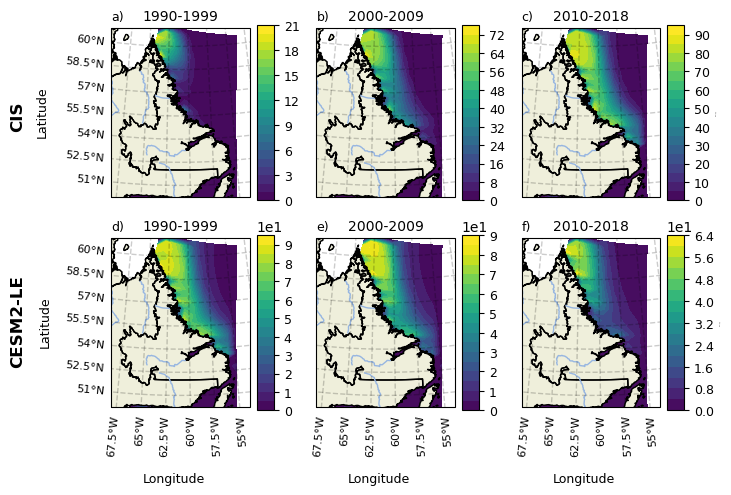

In [12]:
# Create a figure with two# Create a figure with two subplots
fig = plt.figure(figsize=(7.5,5))

selected_data=[sic_months[0],sic_months[1],sic_months[2],sic_months[3],sic_months[4],sic_months[5]]
titles=['1990-1999', '2000-2009','2010-2018','1990-1999', '2000-2009','2010-2018']
letter=['a)','b)','c)','d)','e)','f)']


x0, x1, y0, y1 = -68,-54,50,61

# Calculate the central longitude and latitude
c_lon = (x0 + x1) / 2
c_lat = (y0 + y1) / 2
for i, v in enumerate(selected_data):
#for i in range(3):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(2,3, i+1,projection=ccrs.AlbersEqualArea(central_longitude=c_lon, 
                                                              central_latitude=c_lat,standard_parallels=(y0, y1)))
    ax.set_title(titles[i], fontsize=10)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.LAKES,  zorder=2)
    ax.add_feature(cfeature.LAND, zorder=2)
    ax.add_feature(cfeature.STATES,  zorder=2)
    ax.add_feature(cfeature.BORDERS,  zorder=2)
    #ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS,  zorder=2)
    ax.set_extent([x0, x1, y0, y1])
    ax.text(0,1.05,letter[i], transform=ax.transAxes, fontsize=9)
    
    
    contf=ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i]*100,vmin=0,levels=20,
                   vmax=np.nanmax(selected_data[i].values)*100,transform=ccrs.PlateCarree(), )
    gl = ax.gridlines(draw_labels=False, linewidth=1, color='black', alpha=0.2, linestyle='--',
                          transform=ccrs.PlateCarree())
    cbar=fig.colorbar(contf, ax=ax,aspect=10, pad=0.04,shrink=1 )
    cbar.ax.tick_params(labelsize=9)
    cb = cbar
    
    if i in [0,6]:
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        ax.text(-0.45, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
    
    if i in [2,5]:
        cbar.ax.set_ylabel('SIC (%)', fontsize=1)
        
    if i in [3]:
        ax.text(0.45, -0.46, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
        ax.text(-0.43, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
        gl.xlabels_bottom, gl.ylabels_left =  True, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        cb.formatter.set_powerlimits((0, 0))
        cb.ax.yaxis.set_offset_position('left')
        cb.update_ticks()
        
    if i in [4,5]:
        ax.text(0.45, -0.46, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            rotation_mode='anchor',fontsize=9, transform=ax.transAxes)
        gl.xlabels_bottom, gl.ylabels_left =  True, False
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        cb.formatter.set_powerlimits((0, 0))
        cb.ax.yaxis.set_offset_position('left')
        cb.update_ticks()
        
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}
name=['CIS', 'CESM2-LE']
x=[0.01,0.01]
y=[0.7,0.29]
for i in range (2):
    fig.text(x[i],y[i], name[i], fontweight='bold',va='bottom', ha='center', rotation='vertical',
             rotation_mode='anchor',fontsize=12)
plt.subplots_adjust(wspace=0.2)
#plt.subplots_adjust(hspace=0.7)
#plt.savefig('max_spat_SICmon.jpg',dpi=300, bbox_inches='tight')
plt.show()

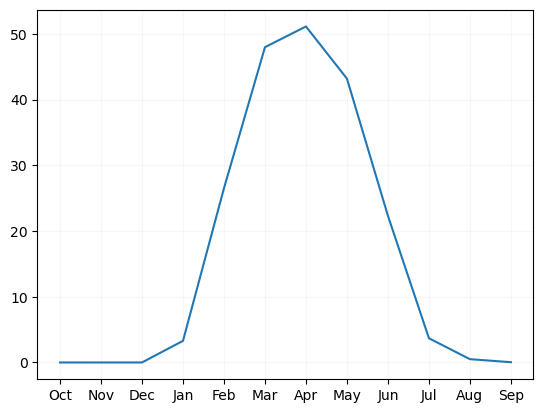

In [271]:
plt.plot(np.append((sic_months[9:].sum(['ni','nj'])),(sic_months[:9].sum(['ni','nj']))))
plt.xticks(np.arange(0,12), ['Oct','Nov','Dec','Jan','Feb','Mar','Apr','May','Jun','Jul','Aug',
                             'Sep',])
plt.grid(alpha=0.1)
plt.show()

In [36]:
#=================mean=========================
# Create a figure with two subplots
'''
fig = plt.figure(figsize=(10, 5))
selected_data=[aice_1850_59, aice_1900_09, aice_1950_59, aice_2000_09, aice_2045_54, aice_2085_94]
titles=['1850-1859','1900-1909','1950-1959','2000-2009','2045-2054','2085-2094']
for i, v in enumerate(selected_data):
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(2,3, i+1, projection=ccrs.PlateCarree())
    cb=ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i].mean('time')*100,
                   levels=45, transform=ccrs.PlateCarree())
    ax.set_title(titles[i])
    ax.coastlines()
    ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.STATES)
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.RIVERS)
    
    #ax.set_extent([-65,-55,50,61])
    if i in [3,4,5]:
        ax.set_ylabel('Latitude')
        ax.set_xlabel('Longitude')
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.03, linestyle='--',
                          transform=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left = True, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
        ax.text(0.5, -0.22, 'longitude'.title(), va='bottom', ha='center', rotation='horizontal',
            rotation_mode='anchor', transform=ax.transAxes)
    if i in [0,1,2]:
        gl = ax.gridlines(draw_labels=True, linewidth=2, color='black', alpha=0.03, linestyle='--',
                          crs=ccrs.PlateCarree())
        gl.xlabels_bottom, gl.ylabels_left =  False, True
        gl.xlabels_top, gl.ylabels_right = False, False
        gl.xformatter = gridliner.LongitudeFormatter()
        gl.yformatter = gridliner.LatitudeFormatter()
    if i in [0,3]:
        ax.text(-0.35, 0.51, 'latitude'.title(), va='bottom', ha='center', rotation='vertical',
                rotation_mode='anchor', transform=ax.transAxes)
cbar_ax = fig.add_axes([0.165, -0.08, 0.7, 0.08])
fig.colorbar(cb, cax=cbar_ax, orientation='horizontal', label='SIC (%)')
plt.suptitle('Overall Mean SIC Values for Six Decades at the Labrador Coast',
             y=0.98, fontweight='bold') 
#plt.savefig('spatial.jpg',dpi=300, bbox_inches='tight')
plt.show()
'''

"\nfig = plt.figure(figsize=(10, 5))\nselected_data=[aice_1850_59, aice_1900_09, aice_1950_59, aice_2000_09, aice_2045_54, aice_2085_94]\ntitles=['1850-1859','1900-1909','1950-1959','2000-2009','2045-2054','2085-2094']\nfor i, v in enumerate(selected_data):\n    # Create a subplot with the PlateCarree projection\n    ax = plt.subplot(2,3, i+1, projection=ccrs.PlateCarree())\n    cb=ax.contourf(selected_data[i].TLON, selected_data[i].TLAT, selected_data[i].mean('time')*100,\n                   levels=45, transform=ccrs.PlateCarree())\n    ax.set_title(titles[i])\n    ax.coastlines()\n    ax.add_feature(cfeature.LAKES)\n    ax.add_feature(cfeature.LAND)\n    ax.add_feature(cfeature.STATES)\n    ax.add_feature(cfeature.BORDERS)\n    ax.add_feature(cfeature.OCEAN)\n    ax.add_feature(cfeature.RIVERS)\n    \n    #ax.set_extent([-65,-55,50,61])\n    if i in [3,4,5]:\n        ax.set_ylabel('Latitude')\n        ax.set_xlabel('Longitude')\n        gl = ax.gridlines(draw_labels=True, linewidth=2

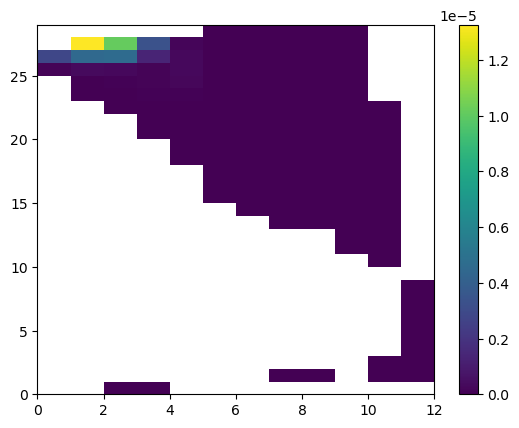

In [282]:
cb=plt.pcolormesh(sic_months[10])
plt.colorbar(cb)

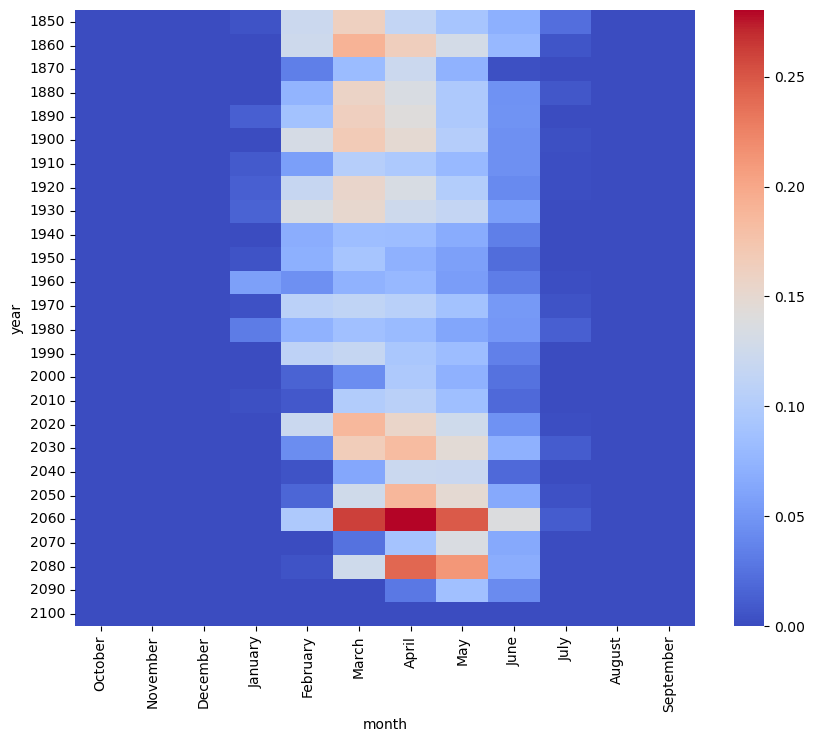

In [63]:
# Convert this DataArray to a DataFrame

ds_mean = aice_region.sum(dim=['nj', 'ni'], skipna=True)
df = ds_mean.to_dataframe(name='aice_max')

# Reset the index so that 'time' becomes a column
df.reset_index(inplace=True)

# Extract the year and month from the 'time' column
df['year'] = [date.year for date in df['time']]
df['month'] = [date.month for date in df['time']]

# Map numeric month to month name
month_dict = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 
              6: 'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 
              11: 'November', 12: 'December'}

df['month'] = df['month'].map(month_dict)

# Define custom sorting order for the months
custom_order = ['October', 'November', 'December', 'January', 'February', 'March',
                'April', 'May', 'June', 'July', 'August', 'September']

# Convert 'month' to categorical data type with custom order
df['month'] = pd.Categorical(df['month'], categories=custom_order, ordered=True)
#df[(df['year'] == 2101) & (df['month'] == 'January')]['aice']
# Filter rows for the specified years
selected_years = np.arange(1850,2101,10)
df_all = df[df['year'].isin(selected_years)]

# Create a pivot table with 'year' as rows, 'month' as columns, and mean 'aice' as values
pivot_df = df_all.pivot('year', 'month', 'aice_max')

# Reorder columns (months) in pivot_df
pivot_df = pivot_df[custom_order]
pivot_df['January'] = pivot_df['January'].shift(-1)
pivot_df.loc[2100,'January']=0

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_df, cmap='coolwarm', )

#plt.title("Monthly Average aice Heatmap for Selected Years")
plt.show()

`Pan-Artic Domain`

In [17]:
# Define the Labrador coast boundaries (replace these with your desired region)
lat_minp, lat_maxp = 50, 90
lon_minp, lon_maxp =0, 360 

# Create a mask for Labrador coast 
mask = ((aice.TLAT >= lat_minp) & (aice.TLAT <= lat_maxp) &
        (aice.TLON >= lon_minp) & (aice.TLON <= lon_maxp))

# Apply the mask to the aice variable
aice_region_p =aice.where(mask, drop=True)
aice_region_p

<xarray.DataArray 'aice' (time: 3012, nj: 80, ni: 320)>
dask.array<where, shape=(3012, 80, 320), dtype=float32, chunksize=(120, 80, 320), chunktype=numpy.ndarray>
Coordinates:
    TLON     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    TLAT     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    ULON     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    ULAT     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
  * time     (time) object 1850-02-01 00:00:00 ... 2101-01-01 00:00:00
Dimensions without coordinates: nj, ni
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged

In [18]:
# Create a mask for Labrador coast 
mask = ((aice.TLAT >= lat_minp) & (aice.TLAT <= lat_maxp) &
        (aice.TLON >= lon_minp) & (aice.TLON <= lon_maxp))

mask2 = ((tarea.TLAT >= lat_minp) & (tarea.TLAT <= lat_maxp) &
        (tarea.TLON >= lon_minp) & (tarea.TLON <= lon_maxp))

# Apply the mask to the aice variable
aice_region_pp=aice.where(mask, drop=True)
tarea_region_pp=tarea.where(mask2, drop=True)

In [19]:
aice_region_pp=((aice_region_pp.where(aice_region_pp>=0.15))*tarea_region_pp)/1e12
#aice_region_pp=((aice_region_pp*tarea_region_pp))/1e12

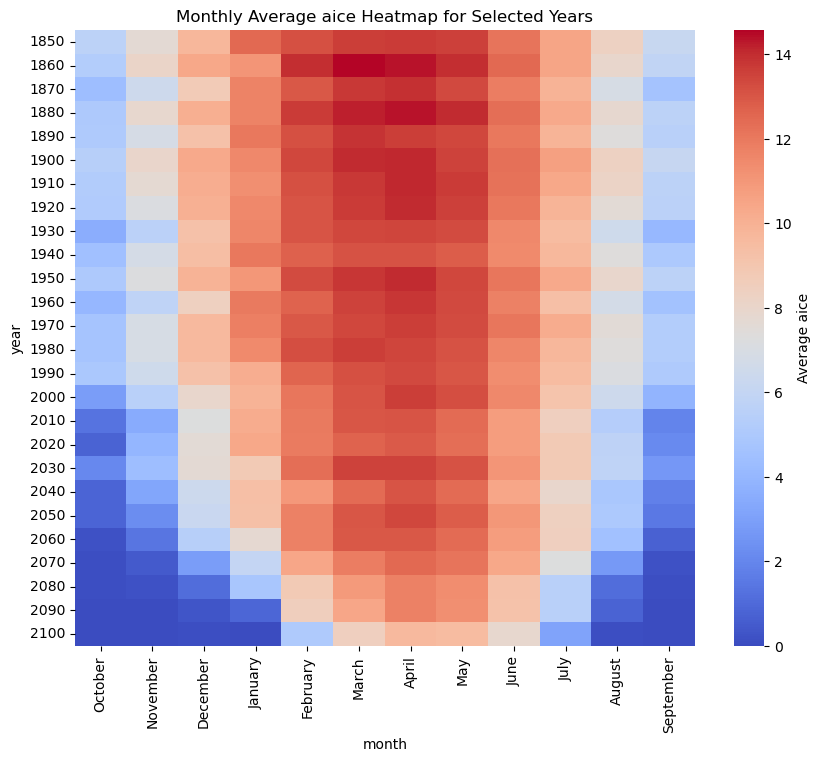

In [49]:
# Convert this DataArray to a DataFrame
ds_mean = aice_region_pp.sum(dim=['nj', 'ni'])
df = ds_mean.to_dataframe(name='aice_max')

# Reset the index so that 'time' becomes a column
df.reset_index(inplace=True)

# Extract the year and month from the 'time' column
df['year'] = [date.year for date in df['time']]
df['month'] = [date.month for date in df['time']]

# Map numeric month to month name
month_dict = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 
              6: 'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 
              11: 'November', 12: 'December'}

df['month'] = df['month'].map(month_dict)

# Define custom sorting order for the months
custom_order = ['October', 'November', 'December', 'January', 'February', 'March',
                'April', 'May', 'June', 'July', 'August', 'September']

# Convert 'month' to categorical data type with custom order
df['month'] = pd.Categorical(df['month'], categories=custom_order, ordered=True)
#df[(df['year'] == 2101) & (df['month'] == 'January')]['aice']
# Filter rows for the specified years
selected_years = np.arange(1850,2101,10)
df_all = df[df['year'].isin(selected_years)]

# Create a pivot table with 'year' as rows, 'month' as columns, and mean 'aice' as values
pivot_df = df_all.pivot('year', 'month', 'aice_max')

# Reorder columns (months) in pivot_df
pivot_df = pivot_df[custom_order]
pivot_df['January'] = pivot_df['January'].shift(-1)
pivot_df.loc[2100,'January']=0

# Plot the heatmap
plt.figure(figsize=(10, 8))
#sns.heatmap(pivot_df,annot=True,fmt='.2f',cmap='coolwarm', cbar_kws={'label': 'Average aice'})
sns.heatmap(pivot_df,cmap='coolwarm', cbar_kws={'label': 'Average aice'})

#plt.title("Monthly Average aice Heatmap for Selected Years")
plt.show()

In [309]:
#Hist
aice_1850_59_p=aice_region_p.sel(time=slice('1850-02-01','1860-01-01'))
aice_1860_69_p=aice_region_p.sel(time=slice('1860-02-01','1870-01-01'))
aice_1870_79_p=aice_region_p.sel(time=slice('1870-02-01','1880-01-01'))
aice_1880_89_p=aice_region_p.sel(time=slice('1880-02-01','1890-01-01'))
aice_1890_99_p=aice_region_p.sel(time=slice('1890-02-01','1900-01-01'))
aice_1900_09_p=aice_region_p.sel(time=slice('1900-02-01','1910-01-01'))
aice_1910_19_p=aice_region_p.sel(time=slice('1910-02-01','1920-01-01'))
aice_1920_29_p=aice_region_p.sel(time=slice('1920-02-01','1930-01-01'))
aice_1930_39_p=aice_region_p.sel(time=slice('1930-02-01','1940-01-01'))
aice_1940_49_p=aice_region_p.sel(time=slice('1940-02-01','1950-01-01'))
aice_1950_59_p=aice_region_p.sel(time=slice('1950-02-01','1960-01-01'))
aice_1960_69_p=aice_region_p.sel(time=slice('1960-02-01','1970-01-01'))
aice_1970_79_p=aice_region_p.sel(time=slice('1970-02-01','1980-01-01'))
aice_1980_89_p=aice_region_p.sel(time=slice('1980-02-01','1990-01-01'))
aice_1990_99_p=aice_region_p.sel(time=slice('1990-02-01','2000-01-01'))
aice_2000_09_p=aice_region_p.sel(time=slice('2000-02-01','2010-01-01'))
aice_2010_14_p=aice_region_p.sel(time=slice('2010-02-01','2015-01-01'))
#Future
aice_2015_24_p=aice_region_p.sel(time=slice('2015-02-01','2025-01-01'))
aice_2025_34_p=aice_region_p.sel(time=slice('2025-02-01','2035-01-01'))
aice_2035_44_p=aice_region_p.sel(time=slice('2035-02-01','2045-01-01'))
aice_2045_54_p=aice_region_p.sel(time=slice('2045-02-01','2055-01-01'))
aice_2055_64_p=aice_region_p.sel(time=slice('2055-02-01','2065-01-01'))
aice_2065_74_p=aice_region_p.sel(time=slice('2065-02-01','2075-01-01'))
aice_2075_84_p=aice_region_p.sel(time=slice('2075-02-01','2085-01-01'))
aice_2085_94_p=aice_region_p.sel(time=slice('2085-02-01','2095-01-01'))
aice_2095_100_p=aice_region_p.sel(time=slice('2095-02-01','2101-01-01'))

In [310]:
#monthly mean hist
aice_1850_59_monthly_p=aice_1850_59_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1860_69_monthly_p=aice_1860_69_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1870_79_monthly_p=aice_1870_79_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1880_89_monthly_p=aice_1880_89_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1890_99_monthly_p=aice_1890_99_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1900_09_monthly_p=aice_1900_09_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1910_19_monthly_p=aice_1910_19_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1920_29_monthly_p=aice_1920_29_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1930_39_monthly_p=aice_1930_39_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1940_49_monthly_p=aice_1940_49_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1950_59_monthly_p=aice_1950_59_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1960_69_monthly_p=aice_1960_69_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1970_79_monthly_p=aice_1970_79_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1980_89_monthly_p=aice_1980_89_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_1990_99_monthly_p=aice_1990_99_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2000_09_monthly_p=aice_2000_09_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2010_14_monthly_p=aice_2010_14_p.groupby('time.month').mean('time').mean(('nj','ni'))

#monthly mean future
aice_2015_24_monthly_p=aice_2015_24_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2025_34_monthly_p=aice_2025_34_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2035_44_monthly_p=aice_2035_44_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2045_54_monthly_p=aice_2045_54_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2055_64_monthly_p=aice_2055_64_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2065_74_monthly_p=aice_2065_74_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2075_84_monthly_p=aice_2075_84_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2085_94_monthly_p=aice_2085_94_p.groupby('time.month').mean('time').mean(('nj','ni'))
aice_2095_100_monthly_p=aice_2095_100_p.groupby('time.month').mean('time').mean(('nj','ni'))

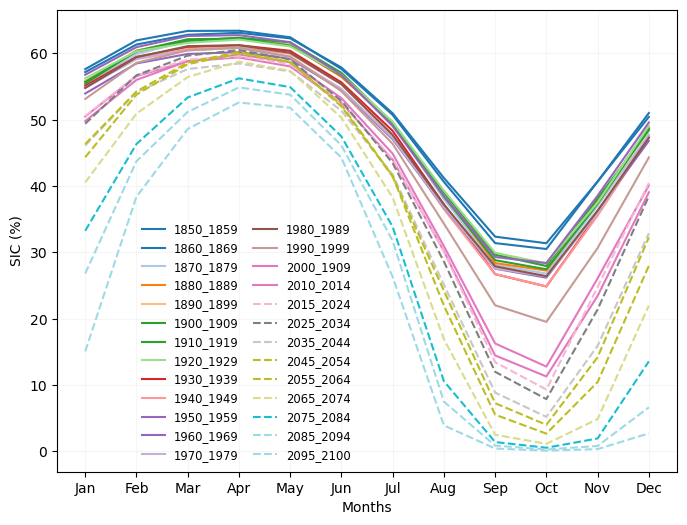

In [313]:
# Set xticks to represent months from January to December
fig,ax=plt.subplots(figsize=(8,6))
all_data=[aice_1850_59_monthly_p,aice_1860_69_monthly_p,aice_1870_79_monthly_p,aice_1880_89_monthly_p,
          aice_1890_99_monthly_p,aice_1900_09_monthly_p,aice_1910_19_monthly_p,aice_1920_29_monthly_p,
          aice_1930_39_monthly_p,aice_1940_49_monthly_p,aice_1950_59_monthly_p,aice_1960_69_monthly_p,
          aice_1970_79_monthly_p,aice_1980_89_monthly_p,aice_1990_99_monthly_p,aice_2000_09_monthly_p,
          aice_2010_14_monthly_p,aice_2015_24_monthly_p,aice_2025_34_monthly_p,aice_2035_44_monthly_p,
          aice_2045_54_monthly_p,aice_2055_64_monthly_p,aice_2065_74_monthly_p,aice_2075_84_monthly_p,
          aice_2085_94_monthly_p,aice_2095_100_monthly_p
]
        
label = ['1850_1859', '1860_1869', '1870_1879', '1880_1889', '1890_1899', '1900_1909', '1910_1919',
          '1920_1929', '1930_1939', '1940_1949', '1950_1959', '1960_1969', '1970_1979', '1980_1989',
          '1990_1999', '2000_1909', '2010_2014', '2015_2024', '2025_2034', '2035_2044', '2045_2054',
          '2055_2064', '2065_2074', '2075_2084', '2085_2094', '2095_2100']


colors=plt.cm.tab20(np.linspace(0, 1, 26))

for i in range(len(all_data)):
    linestyle = '-'  # Default linestyle
    if labels[i] in ['2015_2024', '2025_2034', '2035_2044', '2045_2054', '2055_2064', '2065_2074',
                     '2075_2084', '2085_2094', '2095_2100']:
        linestyle = '--'  # Change linestyle for specific labels

    ax.plot(all_data[i]*100, color=colors[i], linestyle=linestyle, label=label[i])
plt.xticks(np.arange(0,12), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.xlabel('Months')
plt.ylabel('SIC (%)')
#plt.title('Average Monthly SIC variation from 1850 to 2100', fontweight='bold')
#plt.legend(loc='best',fontsize='small')
plt.grid(alpha=0.1)
# Get handles and labels for the lines
handles, labels = plt.gca().get_legend_handles_labels()

# Create two legends
legend1=plt.legend(handles[:13],labels[:13],loc='lower left',bbox_to_anchor=(0.12, 0),frameon=False,fontsize='small')
legend2=plt.legend(handles[13:],labels[13:],loc='lower left',bbox_to_anchor=(0.3, 0),frameon=False,fontsize='small')

# Add the first legend manually to the current Axes
plt.gca().add_artist(legend1)

plt.show()

#panarctic 

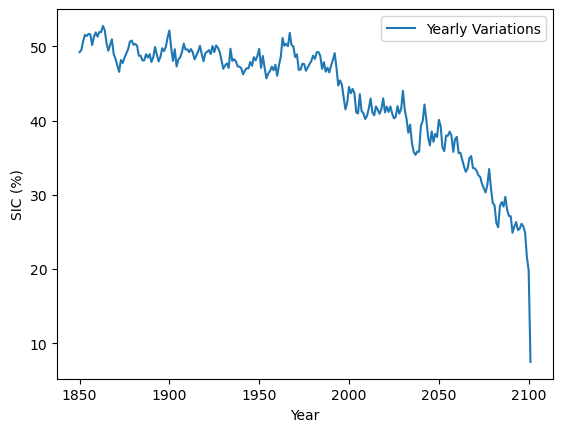

In [24]:
fig, ax=plt.subplots()
# Compute the yearly mean ice area
yearly_mean_p = aice_region_p.mean(('nj', 'ni')).groupby('time.year').mean('time')

# Calculate the mean across all years
overall_mean_p = yearly_mean_p.mean('year')
# Create an array with the same size as the number of years with the overall mean value
mean_line_p = np.full_like(yearly_mean_p, overall_mean_p)
# Plot the yearly variations and the mean line
ax.plot(yearly_mean_p.year, yearly_mean_p*100, label='Yearly Variations')
#plt.plot(yearly_mean.year, mean_line, label='Mean Variation', linestyle='--')
#.plot(yearly_mean_p.year, yearly_mean_p.rolling(year=10, center=True).mean()*100, label='Smoothed Yearly Variations')
plt.xlabel('Year')
plt.ylabel('SIC (%)')
plt.legend()
plt.show()

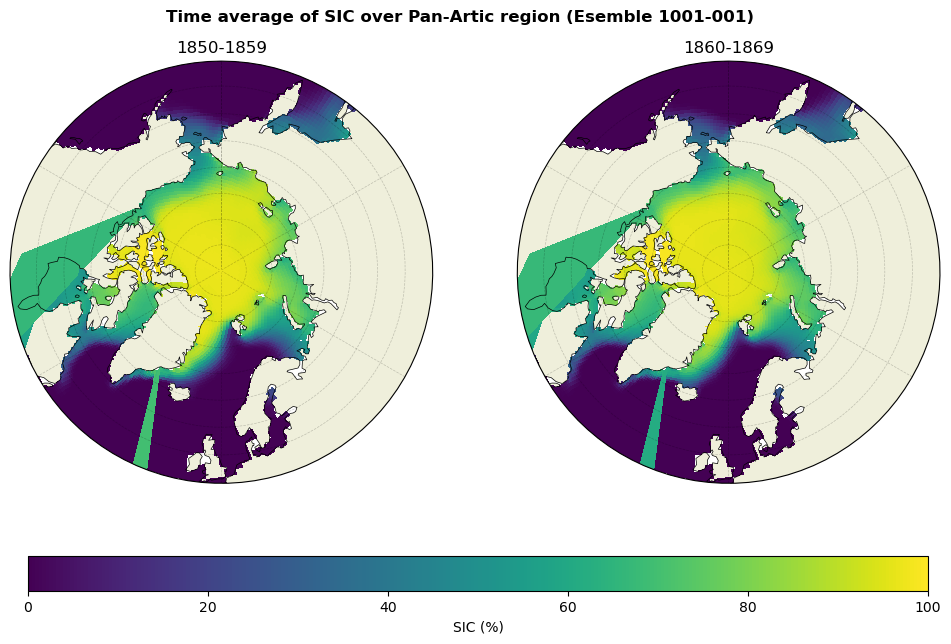

In [25]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(12, 7))
#selected_data=[aice_1850_59_p, aice_1900_09_p, aice_1950_59_p, aice_2000_09_p, aice_2045_54_p, aice_2085_94_p]
#titles=['1850-1859','1900-1909','1950-1959','2000-2009','2045-2054','2085-2094']
selected_data= [aice_1850_59_p, aice_1860_69_p]

titles = ['1850-1859', '1860-1869']



theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
for i, v in enumerate(selected_data): 
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(1,2, i+1, projection=ccrs.NorthPolarStereo())
    cb=ax.pcolormesh(selected_data[i].TLON.where(np.isfinite(selected_data[i].TLON),0),
                     selected_data[i].TLAT.where(np.isfinite(selected_data[i].TLAT),0),
                     selected_data[i].mean('time')*100, vmin=0, vmax=100, transform=ccrs.PlateCarree())
    ax.set_title(titles[i])
    ax.coastlines(linewidth=0.5)
    #ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.STATES)
    #ax.add_feature(cfeature.BORDERS)
    #ax.add_feature(cfeature.OCEAN)
    #ax.add_feature(cfeature.RIVERS)
    ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.2, linestyle='--', 
                      transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    ax.set_boundary(circle, transform=ax.transAxes)
    
cbar_ax = fig.add_axes([0.14, 0.04, 0.75, 0.05])
fig.colorbar(cb, cax=cbar_ax, orientation='horizontal', label='SIC (%)')
plt.suptitle('Time average of SIC over Pan-Artic region (Esemble 1001-001)', y=0.87, fontweight='bold') 
plt.savefig('sample1.jpg',dpi=300, bbox_inches='tight')
#plt.subplots_adjust(wspace=-0.3)

plt.show()

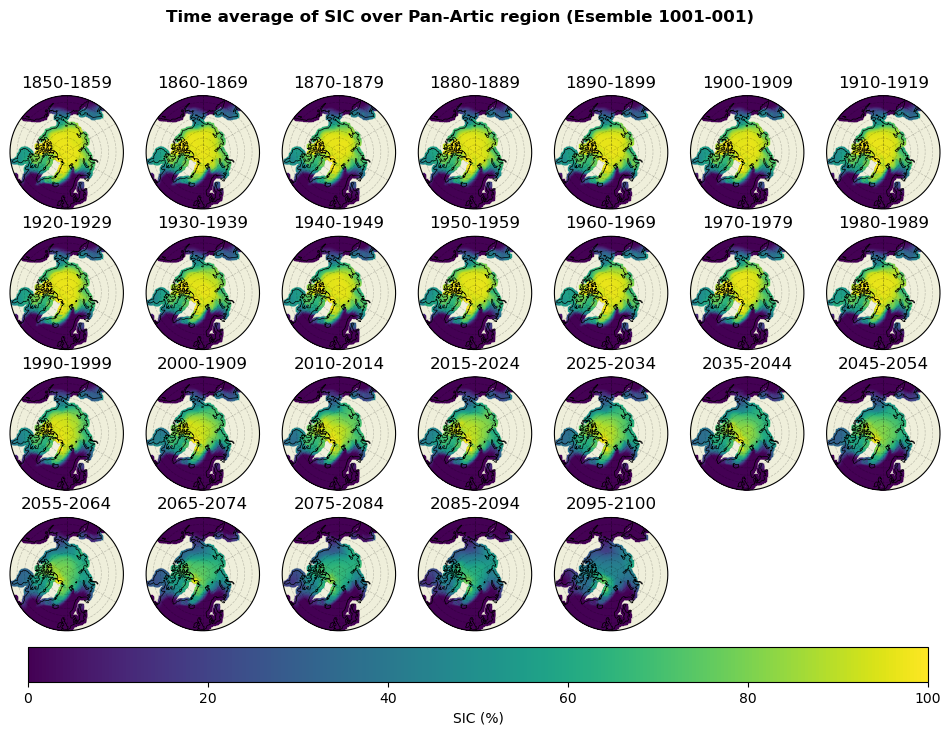

In [26]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(12, 7))
#selected_data=[aice_1850_59_p, aice_1900_09_p, aice_1950_59_p, aice_2000_09_p, aice_2045_54_p, aice_2085_94_p]
#titles=['1850-1859','1900-1909','1950-1959','2000-2009','2045-2054','2085-2094']
selected_data= [aice_1850_59_p, aice_1860_69_p, aice_1870_79_p, aice_1880_89_p, aice_1890_99_p,
                aice_1900_09_p, aice_1910_19_p, aice_1920_29_p, aice_1930_39_p, aice_1940_49_p,
                aice_1950_59_p, aice_1960_69_p, aice_1970_79_p, aice_1980_89_p, aice_1990_99_p,
                aice_2000_09_p, aice_2010_14_p, aice_2015_24_p, aice_2025_34_p, aice_2035_44_p,
                aice_2045_54_p, aice_2055_64_p, aice_2065_74_p, aice_2075_84_p, aice_2085_94_p,
                aice_2095_100_p]

titles = ['1850-1859', '1860-1869', '1870-1879', '1880-1889', '1890-1899', '1900-1909', '1910-1919',
          '1920-1929', '1930-1939', '1940-1949', '1950-1959', '1960-1969', '1970-1979', '1980-1989',
          '1990-1999', '2000-1909', '2010-2014', '2015-2024', '2025-2034', '2035-2044', '2045-2054',
          '2055-2064', '2065-2074', '2075-2084', '2085-2094', '2095-2100']


theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
for i, v in enumerate(selected_data): 
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(4,7, i+1, projection=ccrs.NorthPolarStereo())
    cb=ax.scatter(selected_data[i].TLON,selected_data[i].TLAT,c=selected_data[i].groupby('time.year').mean('time').mean('year')*100,s=5,marker='s',
                   transform=ccrs.PlateCarree(), vmin=0, vmax=100)
    ax.set_title(titles[i])
    ax.coastlines(linewidth=0.5)
    #ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.STATES)
    #ax.add_feature(cfeature.BORDERS)
    #ax.add_feature(cfeature.OCEAN)
    #ax.add_feature(cfeature.RIVERS)
    ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.2, linestyle='--', 
                      transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    ax.set_boundary(circle, transform=ax.transAxes)
    
cbar_ax = fig.add_axes([0.14, 0.04, 0.75, 0.05])
fig.colorbar(cb, cax=cbar_ax, orientation='horizontal', label='SIC (%)')
plt.suptitle('Time average of SIC over Pan-Artic region (Esemble 1001-001)',y=1, fontweight='bold') 
#plt.savefig('sample.jpg',dpi=300, bbox_inches='tight')
#plt.subplots_adjust(wspace=-0.3)

plt.show()

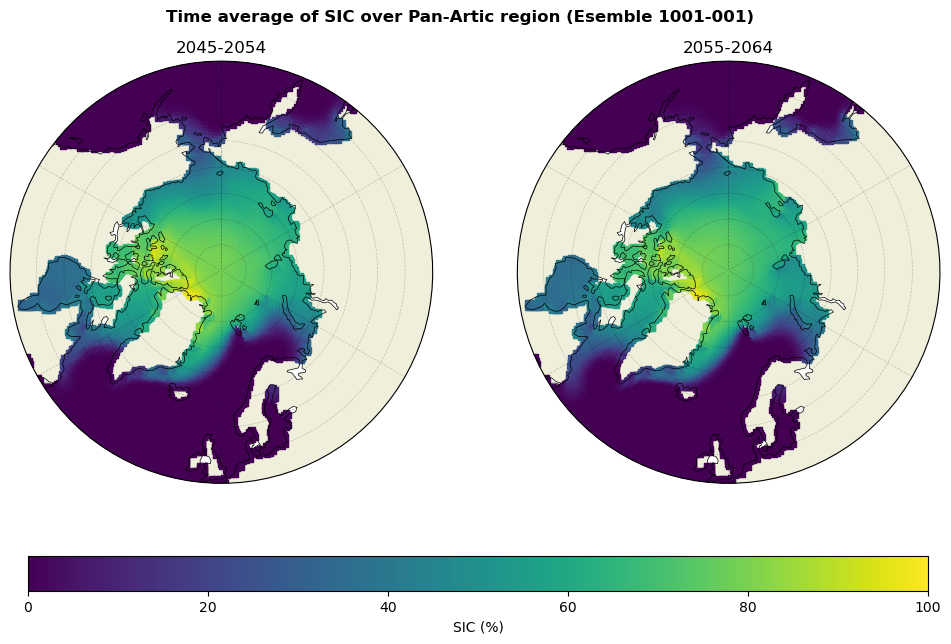

In [27]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(12, 7))
#selected_data=[aice_1850_59_p, aice_1900_09_p, aice_1950_59_p, aice_2000_09_p, aice_2045_54_p, aice_2085_94_p]
#titles=['1850-1859','1900-1909','1950-1959','2000-2009','2045-2054','2085-2094']
selected_data= [aice_2045_54_p, aice_2055_64_p]

titles = ['2045-2054','2055-2064']


theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
for i, v in enumerate(selected_data): 
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(1,2, i+1, projection=ccrs.NorthPolarStereo())
    cb=ax.scatter(selected_data[i].TLON,selected_data[i].TLAT,c=selected_data[i].mean('time')*100,s=20,marker='s',
                   transform=ccrs.PlateCarree(), vmin=0, vmax=100)
    ax.set_title(titles[i])
    ax.coastlines(linewidth=0.5)
    #ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.STATES)
    #ax.add_feature(cfeature.BORDERS)
    #ax.add_feature(cfeature.OCEAN)
    #ax.add_feature(cfeature.RIVERS)
    ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.2, linestyle='--', 
                      transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    ax.set_boundary(circle, transform=ax.transAxes)
    
cbar_ax = fig.add_axes([0.14, 0.04, 0.75, 0.05])
fig.colorbar(cb, cax=cbar_ax, orientation='horizontal', label='SIC (%)')
plt.suptitle('Time average of SIC over Pan-Artic region (Esemble 1001-001)',y=0.87, fontweight='bold') 
plt.savefig('2045-2064_icethick.jpg',dpi=300, bbox_inches='tight')
#plt.subplots_adjust(wspace=-0.3)

plt.show()

In [28]:
aice_2050_p=aice_region_p.sel(time=slice('2050-01','2050-12'))
aice_2050_p

<xarray.DataArray 'aice' (time: 12, nj: 80, ni: 320)>
dask.array<getitem, shape=(12, 80, 320), dtype=float32, chunksize=(12, 80, 320), chunktype=numpy.ndarray>
Coordinates:
    TLON     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    TLAT     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    ULON     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    ULAT     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
  * time     (time) object 2050-01-01 00:00:00 ... 2050-12-01 00:00:00
Dimensions without coordinates: nj, ni
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged

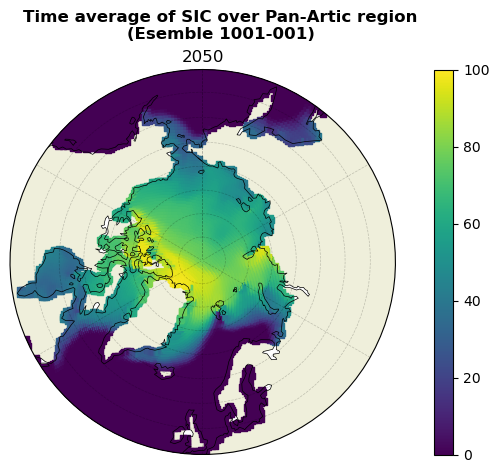

In [29]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(10, 5))
#selected_data=[aice_1850_59_p, aice_1900_09_p, aice_1950_59_p, aice_2000_09_p, aice_2045_54_p, aice_2085_94_p]
#titles=['1850-1859','1900-1909','1950-1959','2000-2009','2045-2054','2085-2094']
selected_data= [aice_2050_p]

titles = [2050]

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
for i, v in enumerate(selected_data): 
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(1,1, i+1, projection=ccrs.NorthPolarStereo())
    cb=ax.scatter(selected_data[i].TLON,selected_data[i].TLAT,c=selected_data[i].mean('time')*100,s=20,marker='s',
                   transform=ccrs.PlateCarree(), vmin=0, vmax=100)
    ax.set_title(titles[i])
    ax.coastlines(linewidth=0.5)
    #ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.STATES)
    #ax.add_feature(cfeature.BORDERS)
    #ax.add_feature(cfeature.OCEAN)
    #ax.add_feature(cfeature.RIVERS)
    ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.2, linestyle='--', 
                      transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    ax.set_boundary(circle, transform=ax.transAxes)
    plt.colorbar(cb)
    
#cbar_ax = fig.add_axes([0.14, 0.04, 0.75, 0.05])
#fig.colorbar(cb, cax=cbar_ax, orientation='vertical', label='SIC (%)')
plt.suptitle('Time average of SIC over Pan-Artic region\n(Esemble 1001-001)',x=0.57, y=1,fontweight='bold') 
#plt.colorbar(cb,label='$SiO_3$($mmol$ $m^{-3}$)', shrink=0.65)
plt.savefig('sample_3.jpg',dpi=300, bbox_inches='tight')
#plt.subplots_adjust(wspace=-0.3)

plt.show()

In [30]:
aice_2050_sept=aice_region_p.sel(time='2050-09-01')
aice_2050_sept

<xarray.DataArray 'aice' (time: 1, nj: 80, ni: 320)>
dask.array<getitem, shape=(1, 80, 320), dtype=float32, chunksize=(1, 80, 320), chunktype=numpy.ndarray>
Coordinates:
    TLON     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    TLAT     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    ULON     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
    ULAT     (nj, ni) float32 dask.array<chunksize=(80, 320), meta=np.ndarray>
  * time     (time) object 2050-09-01 00:00:00
Dimensions without coordinates: nj, ni
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged

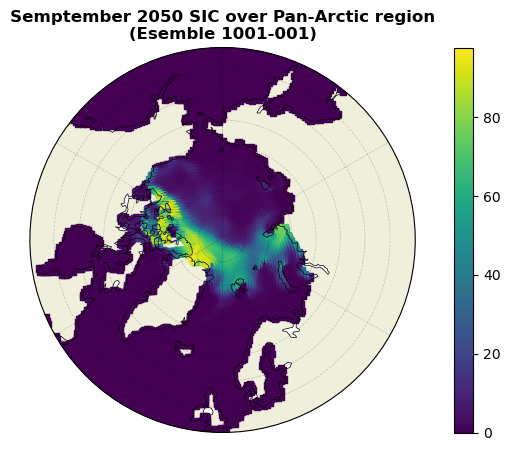

In [31]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(10, 5))
#selected_data=[aice_1850_59_p, aice_1900_09_p, aice_1950_59_p, aice_2000_09_p, aice_2045_54_p, aice_2085_94_p]
#titles=['1850-1859','1900-1909','1950-1959','2000-2009','2045-2054','2085-2094']

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
for i, v in enumerate(selected_data): 
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(1,1, i+1, projection=ccrs.NorthPolarStereo())
    cb=ax.scatter(aice_2050_sept.TLON,aice_2050_sept.TLAT,c=aice_2050_sept*100,s=20,marker='s',
                   transform=ccrs.PlateCarree(),)
    ax.set_title('Semptember 2050 SIC over Pan-Arctic region\n(Esemble 1001-001)',fontweight='bold')
    ax.coastlines(linewidth=0.5)
    #ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.STATES)
    #ax.add_feature(cfeature.BORDERS)
    #ax.add_feature(cfeature.OCEAN)
    #ax.add_feature(cfeature.RIVERS)
    ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.2, linestyle='--', 
                      transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    ax.set_boundary(circle, transform=ax.transAxes)
    plt.colorbar(cb)
    
#cbar_ax = fig.add_axes([0.14, 0.04, 0.75, 0.05])
#fig.colorbar(cb, cax=cbar_ax, orientation='vertical', label='SIC (%)')
#plt.suptitle('Semptember 2050 SIC over Pan-Artic region\n(Esemble 1001-001)',x=0.57, y=1,fontweight='bold') 
#plt.colorbar(cb,label='$SiO_3$($mmol$ $m^{-3}$)', shrink=0.65)
plt.savefig('2050sept_SIC.jpg',dpi=300, bbox_inches='tight')
#plt.subplots_adjust(wspace=-0.3)

plt.show()

#### 2045, 2050, 2055 september SIC 

In [32]:
#2045-2050-2055
aice_2045_sept=aice_region_p.sel(time='2045-09-01')
aice_2050_sept=aice_region_p.sel(time='2050-09-01')
aice_2055_sept=aice_region_p.sel(time='2055-09-01')

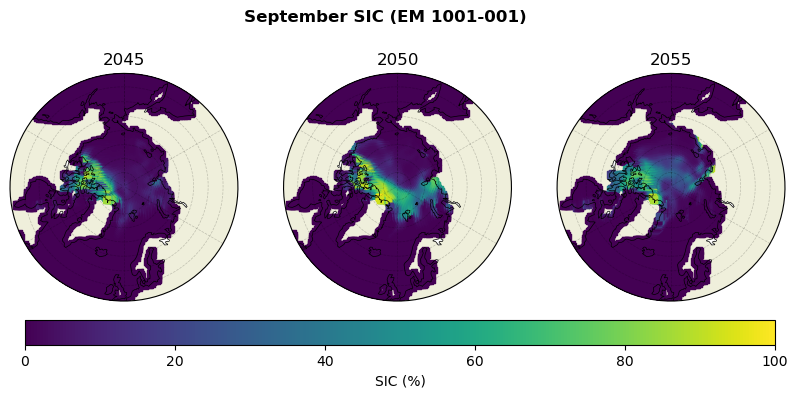

In [33]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(10, 5))
selected_data=[aice_2045_sept, aice_2050_sept, aice_2055_sept]
titles=['2045','2050','2055']

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
for i, v in enumerate(selected_data): 
    # Create a subplot with the PlateCarree projection
    ax = plt.subplot(1,3, i+1, projection=ccrs.NorthPolarStereo())
    cb=ax.scatter(selected_data[i].TLON,selected_data[i].TLAT,c=selected_data[i].groupby('time.year').mean('time').
                  mean('year')*100,s=20,marker='s', transform=ccrs.PlateCarree(),vmax=100, vmin=0)
    ax.set_title(titles[i])
    ax.coastlines(linewidth=0.5)
    #ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.STATES)
    #ax.add_feature(cfeature.BORDERS)
    #ax.add_feature(cfeature.OCEAN)
    #ax.add_feature(cfeature.RIVERS)
    ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.2, linestyle='--', 
                      transform=ccrs.PlateCarree())
    gl.xformatter = gridliner.LongitudeFormatter()
    gl.yformatter = gridliner.LatitudeFormatter()
    ax.set_boundary(circle, transform=ax.transAxes)
    #plt.colorbar(cb)
    
cbar_ax = fig.add_axes([0.14, 0.18, 0.75, 0.05])
fig.colorbar(cb, cax=cbar_ax, orientation='horizontal', label='SIC (%)')
plt.suptitle('September SIC (EM 1001-001)',y=0.85, fontweight='bold') 
#plt.savefig('2045-2064_icethick.jpg',dpi=300, bbox_inches='tight')
plt.savefig('sept_SIC.jpg',dpi=300, bbox_inches='tight')
#plt.subplots_adjust(wspace=-0.3)

plt.show()

#### Decadal mean for september (2045-2055) SIC

In [34]:
#import numpy as np
# Set the NumPy print options to display all values
#np.set_printoptions(threshold=np.inf)
#aice_2045_55_sept_sel = aice_region_p.sel(time=slice('2045', '2055'))[8::12]
#aice_2045_55_sept_fillnana = aice_2045_55_sept_sel.fillna(0)
#aice_2045_55_sept_less = aice_2045_55_sept_fillnana.where(aice_2045_55_sept_fillnana >= 0.15, 0)
#aice_2045_55_sept_great = aice_2045_55_sept_less.where(aice_2045_55_sept_less <= 0.15, 1)
#print(aice_2045_55_sept_less[0].values)

In [35]:
aice_2045_55_sept_sel = aice_region_p.sel(time=slice('2045', '2055'))[8::12].mean('time')
aice_2045_55_sept_fillnana = aice_2045_55_sept_sel.fillna(0)
aice_2045_55_sept_less = aice_2045_55_sept_fillnana.where(aice_2045_55_sept_fillnana >= 0.15, 0)
aice_2045_55_sept_great = aice_2045_55_sept_less.where(aice_2045_55_sept_less <= 0.15, 1)
aice_2045_55_sept=aice_2045_55_sept_great 

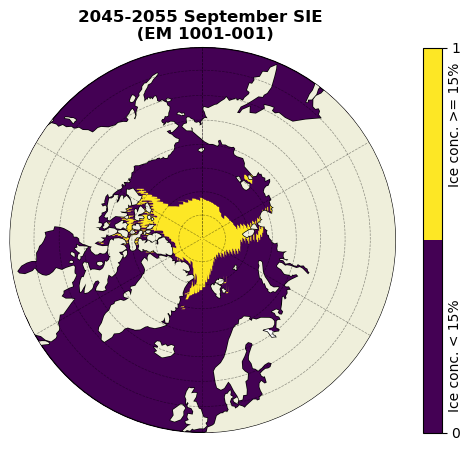

In [36]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(7, 5))
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
viridis = plt.get_cmap('viridis')
cmap = ListedColormap([viridis(0), viridis(255)])
ax = plt.subplot(1,1,1, projection=ccrs.NorthPolarStereo())
cb=ax.scatter(aice_2045_55_sept.TLON, aice_2045_55_sept.TLAT, c=aice_2045_55_sept,
              s=20,marker='s',transform=ccrs.PlateCarree(),cmap=cmap)
ax.set_title('2045-2055 September SIE \n (EM 1001-001)', fontweight='bold')
ax.coastlines(linewidth=1)
#ax.add_feature(cfeature.BORDERS, zorder=6)
ax.add_feature(cfeature.LAND, zorder=4, linewidth=2)
ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.4, linestyle='--',
                  transform=ccrs.PlateCarree(), zorder=8)
gl.xformatter = gridliner.LongitudeFormatter()
gl.yformatter = gridliner.LatitudeFormatter()
ax.set_boundary(circle, transform=ax.transAxes)
clb=plt.colorbar(cb, ticks=[0, 1])
tick_labels = ['Ice conc. < 15%', 'Ice conc. >= 15%']
clb.ax.text(1.7, 0.2, tick_labels[0], color='black', ha='center', va='center', rotation='vertical', )
clb.ax.text(1.7, 0.8, tick_labels[1], color='black', ha='center', va='center', rotation='vertical', )

plt.savefig('2045-2055sept_SIE.jpg',dpi=300, bbox_inches='tight')

plt.show()

#### Decadal mean for september (2090-2100) SIC

In [37]:
aice_2090_2100_sept_sel=aice_region_p.sel(time=slice('2090', '2100'))[8::12].mean('time')
aice_2090_2100_sept_fillnana = aice_2090_2100_sept_sel.fillna(0)
aice_2090_2100_sept_less = aice_2090_2100_sept_fillnana.where(aice_2090_2100_sept_fillnana >= 0.15, 0)
aice_2090_2100_sept_great = aice_2090_2100_sept_less.where(aice_2090_2100_sept_less <= 0.15, 1)
aice_2090_2100_sept=aice_2090_2100_sept_great 

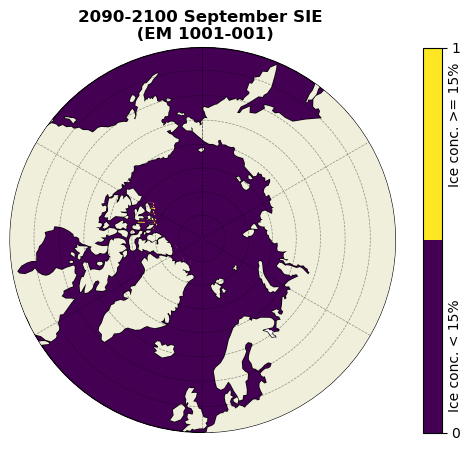

In [38]:
#=================mean=========================
# Create a figure with two subplots
fig = plt.figure(figsize=(7, 5))

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)

# Get the 'viridis' colormap
viridis = plt.get_cmap('viridis')
cmap = ListedColormap([viridis(0), viridis(255)])

ax = plt.subplot(1,1,1, projection=ccrs.NorthPolarStereo())
cb=ax.scatter(aice_2090_2100_sept.TLON, aice_2090_2100_sept.TLAT, c=aice_2090_2100_sept,
              s=20,marker='s',transform=ccrs.PlateCarree(), cmap=cmap)
ax.set_title('2090-2100 September SIE \n (EM 1001-001)', fontweight='bold')
ax.coastlines(linewidth=1)
#ax.add_feature(cfeature.BORDERS, zorder=6)
ax.add_feature(cfeature.LAND, zorder=4)
ax.set_extent([0, 360,50, 90], ccrs.PlateCarree())

gl = ax.gridlines(draw_labels=False, linewidth=0.5, color='black', alpha=0.4, linestyle='--',
                  transform=ccrs.PlateCarree(), zorder=8)
gl.xformatter = gridliner.LongitudeFormatter()
gl.yformatter = gridliner.LatitudeFormatter()
ax.set_boundary(circle, transform=ax.transAxes)
clb=plt.colorbar(cb, ticks=[0, 1])
tick_labels = ['Ice conc. < 15%', 'Ice conc. >= 15%']
clb.ax.text(1.7, 0.2, tick_labels[0], color='black', ha='center', va='center', rotation='vertical', )
clb.ax.text(1.7, 0.8, tick_labels[1], color='black', ha='center', va='center', rotation='vertical', )
plt.savefig('2090-2100sept_SIE.jpg',dpi=300, bbox_inches='tight')

plt.show()

### Esemble 1041-003

`Labrador Coast Domain`

In [39]:
ds2=xr.open_mfdataset(path+'/esemble 1041-003/*.nc')

In [40]:
aice2=ds2['aice']
aice2

<xarray.DataArray 'aice' (time: 3012, nj: 384, ni: 320)>
dask.array<concatenate, shape=(3012, 384, 320), dtype=float32, chunksize=(120, 384, 320), chunktype=numpy.ndarray>
Coordinates:
    TLON     (nj, ni) float32 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT     (nj, ni) float32 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULON     (nj, ni) float32 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT     (nj, ni) float32 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * time     (time) object 1850-02-01 00:00:00 ... 2101-01-01 00:00:00
Dimensions without coordinates: nj, ni
Attributes:
    units:          1
    long_name:      ice area  (aggregate)
    cell_measures:  area: tarea
    cell_methods:   time: mean
    time_rep:       averaged

In [41]:
# Create a mask for Labrador coast 
mask2 = ((aice2.TLAT >= lat_min) & (aice2.TLAT <= lat_max) &
        (aice2.TLON >= lon_min) & (aice2.TLON <= lon_max))

# Apply the mask to the aice variable
aice2_region =aice2.where(mask2, drop=True)

In [42]:
def process_aice_data(start_year, end_year, aice_r):
    aice_data = aice_r.sel(time=slice(f'{start_year}-02-01',f'{end_year}-01-01'))
    aice_monthly = aice_data.groupby('time.month').mean('time').mean(('nj','ni'))
    return aice_data, aice_monthly

#Hist
aice2_1850_59, aice2_1850_59_monthly = process_aice_data(1850, 1860, aice2_region)
aice2_1860_69, aice2_1860_69_monthly = process_aice_data(1860, 1870, aice2_region)
aice2_1870_79, aice2_1870_79_monthly = process_aice_data(1870, 1880, aice2_region)
aice2_1880_89, aice2_1880_89_monthly = process_aice_data(1880, 1890, aice2_region)
aice2_1890_99, aice2_1890_99_monthly = process_aice_data(1890, 1900, aice2_region)
aice2_1900_09, aice2_1900_09_monthly = process_aice_data(1900, 1910, aice2_region)
aice2_1910_19, aice2_1910_19_monthly = process_aice_data(1910, 1920, aice2_region)
aice2_1920_29, aice2_1920_29_monthly = process_aice_data(1920, 1930, aice2_region)
aice2_1930_39, aice2_1930_39_monthly = process_aice_data(1930, 1940, aice2_region)
aice2_1940_49, aice2_1940_49_monthly = process_aice_data(1940, 1950, aice2_region)
aice2_1950_59, aice2_1950_59_monthly = process_aice_data(1950, 1960, aice2_region)
aice2_1960_69, aice2_1960_69_monthly = process_aice_data(1960, 1970, aice2_region)
aice2_1970_79, aice2_1970_79_monthly = process_aice_data(1970, 1980, aice2_region)
aice2_1980_89, aice2_1980_89_monthly = process_aice_data(1980, 1990, aice2_region)
aice2_1990_99, aice2_1990_99_monthly = process_aice_data(1990, 2000, aice2_region)
aice2_2000_09, aice2_2000_09_monthly = process_aice_data(2000, 2010, aice2_region)
aice2_2010_14, aice2_2010_14_monthly = process_aice_data(2010, 2015, aice2_region)

#future
aice2_2015_24, aice2_2015_24_monthly = process_aice_data(2015, 2025, aice2_region)
aice2_2025_34, aice2_2025_34_monthly = process_aice_data(2025, 2035, aice2_region)
aice2_2035_44, aice2_2035_44_monthly = process_aice_data(2035, 2045, aice2_region)
aice2_2045_54, aice2_2045_54_monthly = process_aice_data(2045, 2055, aice2_region)
aice2_2055_64, aice2_2055_64_monthly = process_aice_data(2055, 2065, aice2_region)
aice2_2065_74, aice2_2065_74_monthly = process_aice_data(2065, 2075, aice2_region)
aice2_2075_84, aice2_2075_84_monthly = process_aice_data(2075, 2085, aice2_region)
aice2_2085_94, aice2_2085_94_monthly = process_aice_data(2085, 2095, aice2_region)
aice2_2095_100, aice2_2095_100_monthly = process_aice_data(2095, 2101, aice2_region)

In [43]:
# Set xticks to represent months from January to December
'''
fig,ax=plt.subplots(figsize=(8,6))
all_data2 = [aice2_1850_59_monthly, aice2_1860_69_monthly, aice2_1870_79_monthly, aice2_1880_89_monthly, 
             aice2_1890_99_monthly, aice2_1900_09_monthly, aice2_1910_19_monthly, aice2_1920_29_monthly, 
             aice2_1930_39_monthly, aice2_1940_49_monthly, aice2_1950_59_monthly, aice2_1960_69_monthly,
             aice2_1970_79_monthly, aice2_1980_89_monthly, aice2_1990_99_monthly, aice2_2000_09_monthly,
             aice2_2010_14_monthly, aice2_2015_24_monthly, aice2_2025_34_monthly, aice2_2035_44_monthly,
             aice2_2045_54_monthly, aice2_2055_64_monthly, aice2_2065_74_monthly, aice2_2075_84_monthly,
             aice2_2085_94_monthly, aice2_2095_100_monthly]
        
labels = ['1850_1859', '1860_1869', '1870_1879', '1880_1889', '1890_1899', '1900_1909', '1910_1919',
          '1920_1929', '1930_1939', '1940_1949', '1950_1959', '1960_1969', '1970_1979', '1980_1989',
          '1990_1999', '2000_1909', '2010_2014', '2015_2024', '2025_2034', '2035_2044', '2045_2054',
          '2055_2064', '2065_2074', '2075_2084', '2085_2094', '2095_2100']


colors=plt.cm.tab20(np.linspace(0, 1, 26))

for i in range(len(all_data)):
    linestyle = '-'  # Default linestyle
    if labels[i] in ['2015_2024', '2025_2034', '2035_2044', '2045_2054', '2055_2064', '2065_2074',
                     '2075_2084', '2085_2094', '2095_2100']:
        linestyle = '--'  # Change linestyle for specific labels

    ax.plot(all_data2[i]*100, color=colors[i], linestyle=linestyle, label=labels[i])
plt.xticks(np.arange(0,12), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.xlabel('Months')
plt.ylabel('SIC (%)')
#plt.title('Average Monthly SIC variation from 1850 to 2100', fontweight='bold')
#plt.legend(loc='best',fontsize='small')
plt.grid(alpha=0.1)
# Get handles and labels for the lines
handles, labels = plt.gca().get_legend_handles_labels()

# Create two legends
legend1=plt.legend(handles[:13],labels[:13],loc='upper right',bbox_to_anchor=(0.12, 0),frameon=False,fontsize='small')
legend2=plt.legend(handles[13:],labels[13:],loc='upper right',bbox_to_anchor=(0.3, 0),frameon=False,fontsize='small')

# Add the first legend manually to the current Axes
plt.gca().add_artist(legend1)

plt.show()
'''
#panarctic 

"\nfig,ax=plt.subplots(figsize=(8,6))\nall_data2 = [aice2_1850_59_monthly, aice2_1860_69_monthly, aice2_1870_79_monthly, aice2_1880_89_monthly, \n             aice2_1890_99_monthly, aice2_1900_09_monthly, aice2_1910_19_monthly, aice2_1920_29_monthly, \n             aice2_1930_39_monthly, aice2_1940_49_monthly, aice2_1950_59_monthly, aice2_1960_69_monthly,\n             aice2_1970_79_monthly, aice2_1980_89_monthly, aice2_1990_99_monthly, aice2_2000_09_monthly,\n             aice2_2010_14_monthly, aice2_2015_24_monthly, aice2_2025_34_monthly, aice2_2035_44_monthly,\n             aice2_2045_54_monthly, aice2_2055_64_monthly, aice2_2065_74_monthly, aice2_2075_84_monthly,\n             aice2_2085_94_monthly, aice2_2095_100_monthly]\n        \nlabels = ['1850_1859', '1860_1869', '1870_1879', '1880_1889', '1890_1899', '1900_1909', '1910_1919',\n          '1920_1929', '1930_1939', '1940_1949', '1950_1959', '1960_1969', '1970_1979', '1980_1989',\n          '1990_1999', '2000_1909', '2010_2014',

### 12 Esembles Data

`Labrador Coast Domain`

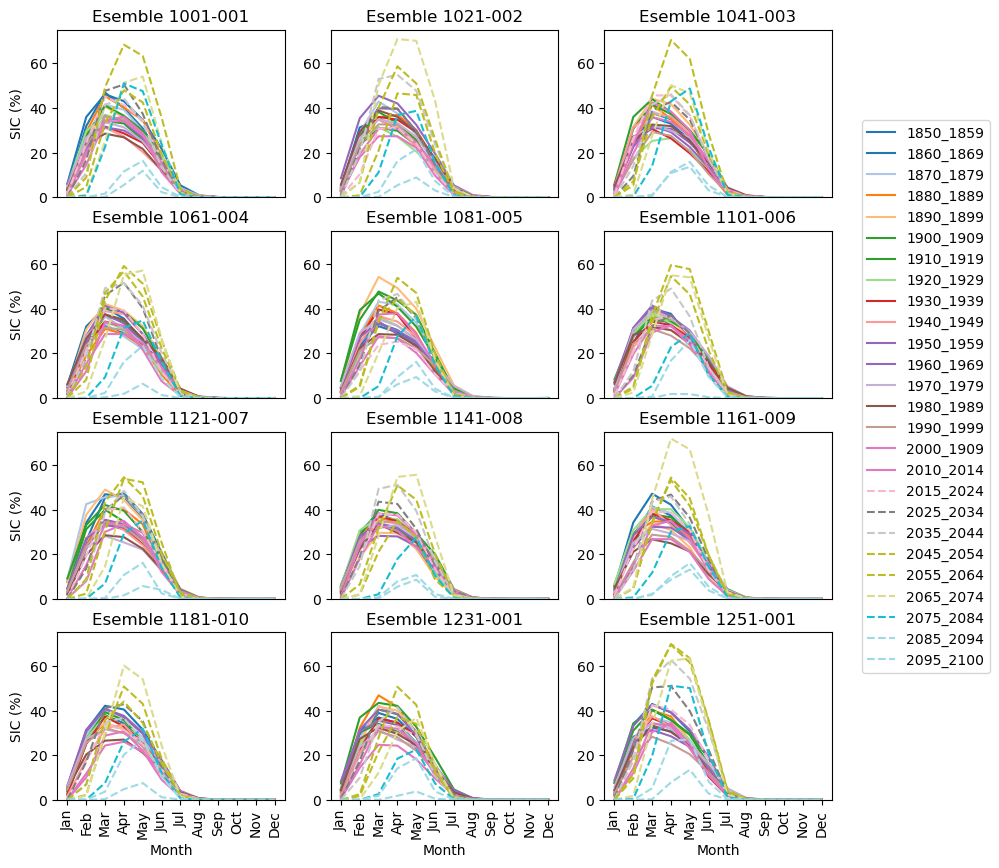

In [44]:
esembles_name=['esemble 1001-001','esemble 1021-002','esemble 1041-003','esemble 1061-004','esemble 1081-005',
               'esemble 1101-006','esemble 1121-007','esemble 1141-008','esemble 1161-009','esemble 1181-010',
               'esemble 1231-001','esemble 1251-001']
fig = plt.figure(figsize=(10, 10))
for i,v in enumerate(esembles_name):
    ds=xr.open_mfdataset(path+'/'+esembles_name[i]+'/*.nc')
    aice_data=ds.aice
    lat_min, lat_max = 50, 61
    lon_min, lon_max =295, 305 #65W & 55W
    mask = ((aice_data.TLAT >= lat_min) & (aice_data.TLAT <= lat_max) & (aice_data.TLON >= lon_min) &
            (aice_data.TLON <= lon_max))
    aice_reg= aice_data.where(mask, drop=True)
    
    def process_aice_data(start_year, end_year, aice_r):
        aice_d = aice_r.sel(time=slice(f'{start_year}-02-01',f'{end_year}-01-01'))
        aice_monthly = aice_d.groupby('time.month').mean('time').mean(('nj','ni'))
        return aice_monthly
   
    #Past
    aice_1850_59_data = process_aice_data(1850, 1860, aice_reg)
    aice_1860_69_data = process_aice_data(1860, 1870, aice_reg)
    aice_1870_79_data = process_aice_data(1870, 1880, aice_reg)
    aice_1880_89_data = process_aice_data(1880, 1890, aice_reg)
    aice_1890_99_data = process_aice_data(1890, 1900, aice_reg)
    aice_1900_09_data = process_aice_data(1900, 1910, aice_reg)
    aice_1910_19_data = process_aice_data(1910, 1920, aice_reg)
    aice_1920_29_data = process_aice_data(1920, 1930, aice_reg)
    aice_1930_39_data = process_aice_data(1930, 1940, aice_reg)
    aice_1940_49_data = process_aice_data(1940, 1950, aice_reg)
    aice_1950_59_data = process_aice_data(1950, 1960, aice_reg)
    aice_1960_69_data = process_aice_data(1960, 1970, aice_reg)
    aice_1970_79_data = process_aice_data(1970, 1980, aice_reg)
    aice_1980_89_data = process_aice_data(1980, 1990, aice_reg)
    aice_1990_99_data = process_aice_data(1990, 2000, aice_reg)
    aice_2000_09_data = process_aice_data(2000, 2010, aice_reg)
    aice_2010_14_data = process_aice_data(2010, 2015, aice_reg)
    #Future
    aice_2015_24_data = process_aice_data(2015, 2025, aice_reg)
    aice_2025_34_data = process_aice_data(2025, 2035, aice_reg)
    aice_2035_44_data = process_aice_data(2035, 2045, aice_reg)
    aice_2045_54_data = process_aice_data(2045, 2055, aice_reg)
    aice_2055_64_data = process_aice_data(2055, 2065, aice_reg)
    aice_2065_74_data = process_aice_data(2065, 2075, aice_reg)
    aice_2075_84_data = process_aice_data(2075, 2085, aice_reg)
    aice_2085_94_data = process_aice_data(2085, 2095, aice_reg)
    aice_2095_100_data = process_aice_data(2095, 2101, aice_reg)
    
    ax = plt.subplot(4,3, i+1)
    dataset = [ aice_1850_59_data, aice_1860_69_data, aice_1870_79_data, aice_1880_89_data, 
                aice_1890_99_data, aice_1900_09_data, aice_1910_19_data, aice_1920_29_data, 
                aice_1930_39_data, aice_1940_49_data, aice_1950_59_data, aice_1960_69_data,
                aice_1970_79_data, aice_1980_89_data, aice_1990_99_data, aice_2000_09_data,
                aice_2010_14_data, aice_2015_24_data, aice_2025_34_data, aice_2035_44_data,
                aice_2045_54_data, aice_2055_64_data, aice_2065_74_data, aice_2075_84_data,
                aice_2085_94_data, aice_2095_100_data]
        
    labels = ['1850_1859', '1860_1869', '1870_1879', '1880_1889', '1890_1899', '1900_1909', '1910_1919',
              '1920_1929', '1930_1939', '1940_1949', '1950_1959', '1960_1969', '1970_1979', '1980_1989',
              '1990_1999', '2000_1909', '2010_2014', '2015_2024', '2025_2034', '2035_2044', '2045_2054',
              '2055_2064', '2065_2074', '2075_2084', '2085_2094', '2095_2100']


    colors=plt.cm.tab20(np.linspace(0, 1, 26))

    for j in range(len(dataset)):
        linestyle = '-'
        ax.set_title(v.title())
        #plt.grid(alpha=0.1)
        if labels[j] in ['2015_2024', '2025_2034', '2035_2044', '2045_2054', '2055_2064', '2065_2074','2075_2084',
                         '2085_2094', '2095_2100']:
            linestyle = '--' 
        ax.plot(dataset[j]*100, color=colors[j], linestyle=linestyle, label=labels[j])
    if i in [9,10,11]:
        plt.xlabel('Month')
        plt.xticks(np.arange(0,12), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep',
                                         'Oct','Nov','Dec'], rotation=90)
    else:
        plt.xticks([]) 
    if i in [0,3,6,9]:
        plt.ylabel('SIC (%)')
    plt.ylim(0, 75)
    if i in [2]:
        plt.legend(bbox_to_anchor=(1.1, 0.5),loc='best')
plt.show()


`Pan-Artic Domain`

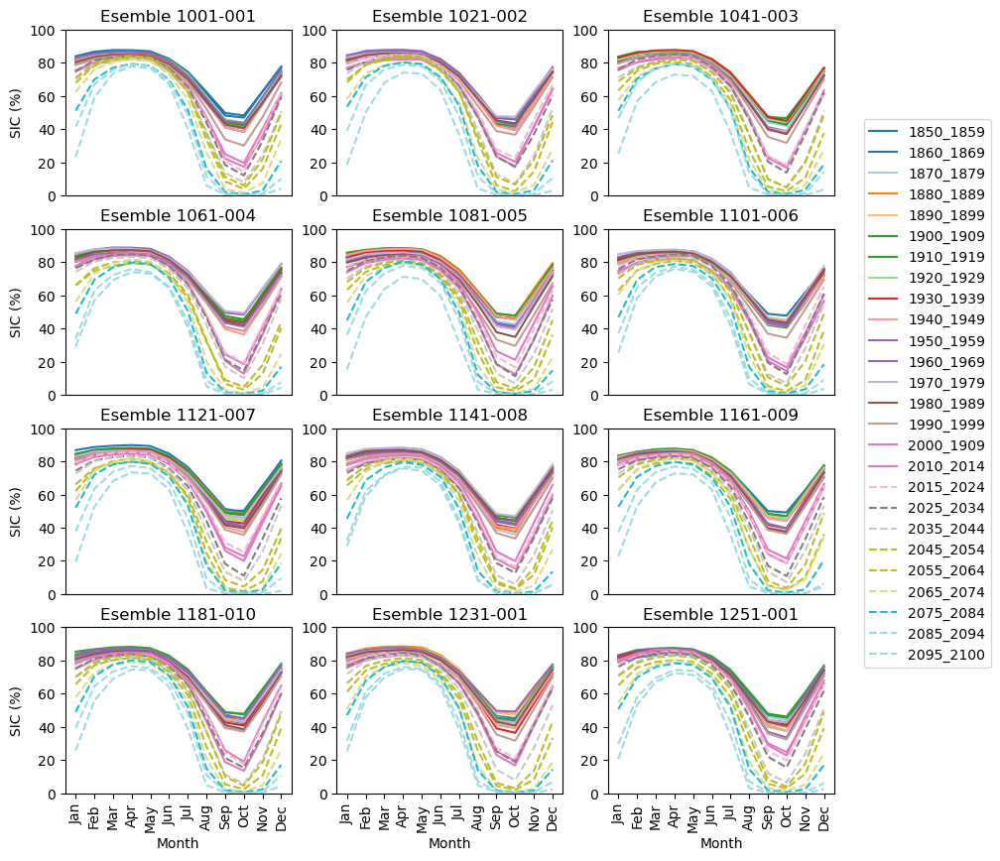

In [45]:
esembles_name=['esemble 1001-001','esemble 1021-002','esemble 1041-003','esemble 1061-004','esemble 1081-005',
               'esemble 1101-006','esemble 1121-007','esemble 1141-008','esemble 1161-009','esemble 1181-010',
               'esemble 1231-001','esemble 1251-001']
fig = plt.figure(figsize=(10, 10))
for i,v in enumerate(esembles_name):
    ds=xr.open_mfdataset(path+'/'+esembles_name[i]+'/*.nc')
    aice_data=ds.aice
    lat_min, lat_max = 65, 90
    lon_min, lon_max = 0, 360 #65W & 55W
    mask = ((aice_data.TLAT >= lat_min) & (aice_data.TLAT <= lat_max) & (aice_data.TLON >= lon_min) &
            (aice_data.TLON <= lon_max))
    aice_reg= aice_data.where(mask, drop=True)
    
    def process_aice_data(start_year, end_year, aice_r):
        aice_d = aice_r.sel(time=slice(f'{start_year}-02-01',f'{end_year}-01-01'))
        aice_monthly = aice_d.groupby('time.month').mean('time').mean(('nj','ni'))
        return aice_monthly
   
    #Past
    aice_1850_59_data = process_aice_data(1850, 1860, aice_reg)
    aice_1860_69_data = process_aice_data(1860, 1870, aice_reg)
    aice_1870_79_data = process_aice_data(1870, 1880, aice_reg)
    aice_1880_89_data = process_aice_data(1880, 1890, aice_reg)
    aice_1890_99_data = process_aice_data(1890, 1900, aice_reg)
    aice_1900_09_data = process_aice_data(1900, 1910, aice_reg)
    aice_1910_19_data = process_aice_data(1910, 1920, aice_reg)
    aice_1920_29_data = process_aice_data(1920, 1930, aice_reg)
    aice_1930_39_data = process_aice_data(1930, 1940, aice_reg)
    aice_1940_49_data = process_aice_data(1940, 1950, aice_reg)
    aice_1950_59_data = process_aice_data(1950, 1960, aice_reg)
    aice_1960_69_data = process_aice_data(1960, 1970, aice_reg)
    aice_1970_79_data = process_aice_data(1970, 1980, aice_reg)
    aice_1980_89_data = process_aice_data(1980, 1990, aice_reg)
    aice_1990_99_data = process_aice_data(1990, 2000, aice_reg)
    aice_2000_09_data = process_aice_data(2000, 2010, aice_reg)
    aice_2010_14_data = process_aice_data(2010, 2015, aice_reg)
    #Future
    aice_2015_24_data = process_aice_data(2015, 2025, aice_reg)
    aice_2025_34_data = process_aice_data(2025, 2035, aice_reg)
    aice_2035_44_data = process_aice_data(2035, 2045, aice_reg)
    aice_2045_54_data = process_aice_data(2045, 2055, aice_reg)
    aice_2055_64_data = process_aice_data(2055, 2065, aice_reg)
    aice_2065_74_data = process_aice_data(2065, 2075, aice_reg)
    aice_2075_84_data = process_aice_data(2075, 2085, aice_reg)
    aice_2085_94_data = process_aice_data(2085, 2095, aice_reg)
    aice_2095_100_data = process_aice_data(2095, 2101, aice_reg)
    
    ax = plt.subplot(4,3, i+1)
    dataset = [ aice_1850_59_data, aice_1860_69_data, aice_1870_79_data, aice_1880_89_data, 
                aice_1890_99_data, aice_1900_09_data, aice_1910_19_data, aice_1920_29_data, 
                aice_1930_39_data, aice_1940_49_data, aice_1950_59_data, aice_1960_69_data,
                aice_1970_79_data, aice_1980_89_data, aice_1990_99_data, aice_2000_09_data,
                aice_2010_14_data, aice_2015_24_data, aice_2025_34_data, aice_2035_44_data,
                aice_2045_54_data, aice_2055_64_data, aice_2065_74_data, aice_2075_84_data,
                aice_2085_94_data, aice_2095_100_data]
        
    labels = ['1850_1859', '1860_1869', '1870_1879', '1880_1889', '1890_1899', '1900_1909', '1910_1919',
              '1920_1929', '1930_1939', '1940_1949', '1950_1959', '1960_1969', '1970_1979', '1980_1989',
              '1990_1999', '2000_1909', '2010_2014', '2015_2024', '2025_2034', '2035_2044', '2045_2054',
              '2055_2064', '2065_2074', '2075_2084', '2085_2094', '2095_2100']


    colors=plt.cm.tab20(np.linspace(0, 1, 26))

    for j in range(len(dataset)):
        linestyle = '-'
        ax.set_title(v.title())
        #plt.grid(alpha=0.1)
        if labels[j] in ['2015_2024', '2025_2034', '2035_2044', '2045_2054', '2055_2064', '2065_2074','2075_2084',
                         '2085_2094', '2095_2100']:
            linestyle = '--' 
        ax.plot(dataset[j]*100, color=colors[j], linestyle=linestyle, label=labels[j])
    if i in [9,10,11]:
        plt.xlabel('Month')
        plt.xticks(np.arange(0,12), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep',
                                         'Oct','Nov','Dec'], rotation=90)
    else:
        plt.xticks([]) 
    if i in [0,3,6,9]:
        plt.ylabel('SIC (%)')
    plt.ylim(0, 100)
    if i in [2]:
        plt.legend(bbox_to_anchor=(1.1, 0.5),loc='best')
plt.show()


`Baffin Bay Domain`

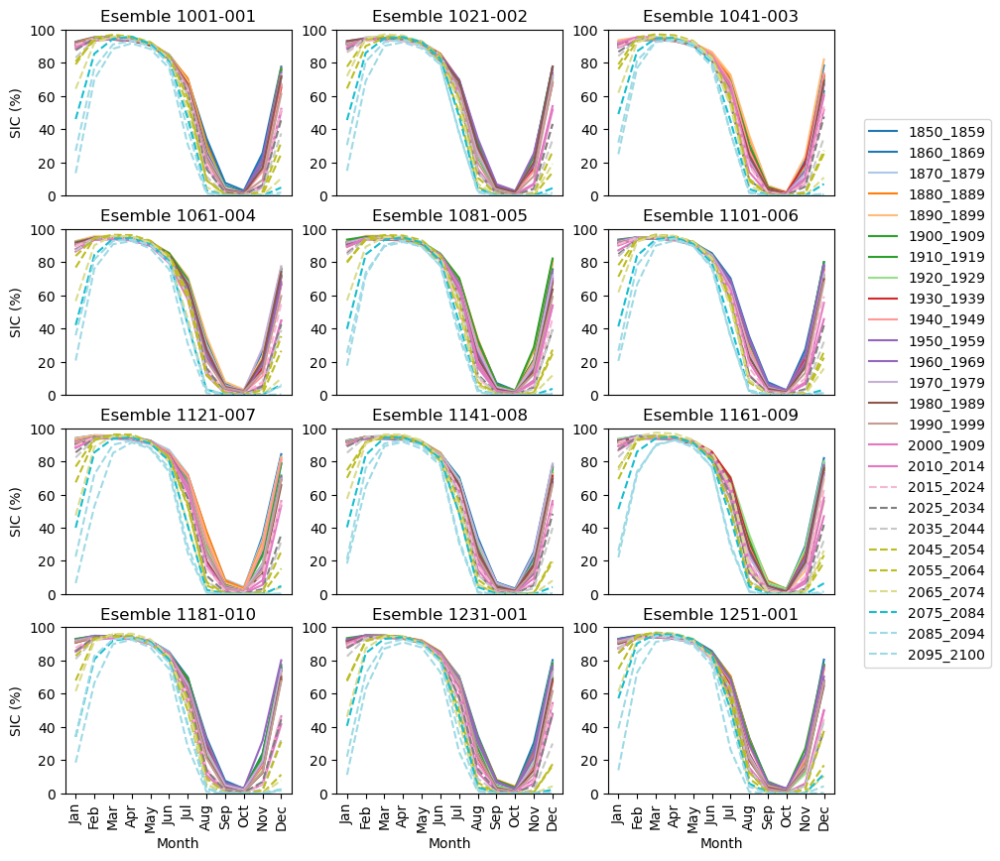

In [46]:
esembles_name=['esemble 1001-001','esemble 1021-002','esemble 1041-003','esemble 1061-004','esemble 1081-005',
               'esemble 1101-006','esemble 1121-007','esemble 1141-008','esemble 1161-009','esemble 1181-010',
               'esemble 1231-001','esemble 1251-001']
fig = plt.figure(figsize=(10, 10))
for i,v in enumerate(esembles_name):
    ds=xr.open_mfdataset(path+'/'+esembles_name[i]+'/*.nc')
    aice_data=ds.aice
    lat_min, lat_max = 64, 76
    lon_min, lon_max =278.5, 310 #65W & 55W
    mask = ((aice_data.TLAT >= lat_min) & (aice_data.TLAT <= lat_max) & (aice_data.TLON >= lon_min) &
            (aice_data.TLON <= lon_max))
    aice_reg= aice_data.where(mask, drop=True)
    
    def process_aice_data(start_year, end_year, aice_r):
        aice_d = aice_r.sel(time=slice(f'{start_year}-02-01',f'{end_year}-01-01'))
        aice_monthly = aice_d.groupby('time.month').mean('time').mean(('nj','ni'))
        return aice_monthly
   
    #Past
    aice_1850_59_data = process_aice_data(1850, 1860, aice_reg)
    aice_1860_69_data = process_aice_data(1860, 1870, aice_reg)
    aice_1870_79_data = process_aice_data(1870, 1880, aice_reg)
    aice_1880_89_data = process_aice_data(1880, 1890, aice_reg)
    aice_1890_99_data = process_aice_data(1890, 1900, aice_reg)
    aice_1900_09_data = process_aice_data(1900, 1910, aice_reg)
    aice_1910_19_data = process_aice_data(1910, 1920, aice_reg)
    aice_1920_29_data = process_aice_data(1920, 1930, aice_reg)
    aice_1930_39_data = process_aice_data(1930, 1940, aice_reg)
    aice_1940_49_data = process_aice_data(1940, 1950, aice_reg)
    aice_1950_59_data = process_aice_data(1950, 1960, aice_reg)
    aice_1960_69_data = process_aice_data(1960, 1970, aice_reg)
    aice_1970_79_data = process_aice_data(1970, 1980, aice_reg)
    aice_1980_89_data = process_aice_data(1980, 1990, aice_reg)
    aice_1990_99_data = process_aice_data(1990, 2000, aice_reg)
    aice_2000_09_data = process_aice_data(2000, 2010, aice_reg)
    aice_2010_14_data = process_aice_data(2010, 2015, aice_reg)
    #Future
    aice_2015_24_data = process_aice_data(2015, 2025, aice_reg)
    aice_2025_34_data = process_aice_data(2025, 2035, aice_reg)
    aice_2035_44_data = process_aice_data(2035, 2045, aice_reg)
    aice_2045_54_data = process_aice_data(2045, 2055, aice_reg)
    aice_2055_64_data = process_aice_data(2055, 2065, aice_reg)
    aice_2065_74_data = process_aice_data(2065, 2075, aice_reg)
    aice_2075_84_data = process_aice_data(2075, 2085, aice_reg)
    aice_2085_94_data = process_aice_data(2085, 2095, aice_reg)
    aice_2095_100_data = process_aice_data(2095, 2101, aice_reg)
    
    ax = plt.subplot(4,3, i+1)
    dataset = [ aice_1850_59_data, aice_1860_69_data, aice_1870_79_data, aice_1880_89_data, 
                aice_1890_99_data, aice_1900_09_data, aice_1910_19_data, aice_1920_29_data, 
                aice_1930_39_data, aice_1940_49_data, aice_1950_59_data, aice_1960_69_data,
                aice_1970_79_data, aice_1980_89_data, aice_1990_99_data, aice_2000_09_data,
                aice_2010_14_data, aice_2015_24_data, aice_2025_34_data, aice_2035_44_data,
                aice_2045_54_data, aice_2055_64_data, aice_2065_74_data, aice_2075_84_data,
                aice_2085_94_data, aice_2095_100_data]
        
    labels = ['1850_1859', '1860_1869', '1870_1879', '1880_1889', '1890_1899', '1900_1909', '1910_1919',
              '1920_1929', '1930_1939', '1940_1949', '1950_1959', '1960_1969', '1970_1979', '1980_1989',
              '1990_1999', '2000_1909', '2010_2014', '2015_2024', '2025_2034', '2035_2044', '2045_2054',
              '2055_2064', '2065_2074', '2075_2084', '2085_2094', '2095_2100']


    colors=plt.cm.tab20(np.linspace(0, 1, 26))

    for j in range(len(dataset)):
        linestyle = '-'
        ax.set_title(v.title())
        #plt.grid(alpha=0.1)
        if labels[j] in ['2015_2024', '2025_2034', '2035_2044', '2045_2054', '2055_2064', '2065_2074','2075_2084',
                         '2085_2094', '2095_2100']:
            linestyle = '--' 
        ax.plot(dataset[j]*100, color=colors[j], linestyle=linestyle, label=labels[j])
    if i in [9,10,11]:
        plt.xlabel('Month')
        plt.xticks(np.arange(0,12), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep',
                                         'Oct','Nov','Dec'], rotation=90)
    else:
        plt.xticks([]) 
    if i in [0,3,6,9]:
        plt.ylabel('SIC (%)')
    plt.ylim(0, 100)
    if i in [2]:
        plt.legend(bbox_to_anchor=(1.1, 0.5),loc='best')
plt.show()


In [47]:
plt.scatter()

TypeError: scatter() missing 2 required positional arguments: 'x' and 'y'

In [15]:
import numpy as np
import matplotlib.pyplot as plt

In [14]:
x=np.ones(10)

In [4]:
y=3

In [5]:
x+y

5

In [11]:
whos

Variable   Type       Data/Info
-------------------------------
np         module     <module 'numpy' from '/op<...>kages/numpy/__init__.py'>
x          ndarray    10: 10 elems, type `float64`, 80 bytes
y          int        3


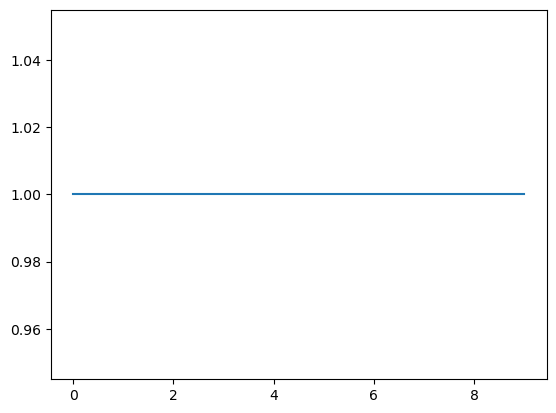

In [17]:
plt.plot(x)